https://www.kaggle.com/datasets/kumarajarshi/life-expectancy-who

https://plotly.com/python/line-and-scatter/

In [1]:
!pip install tslearn

In [92]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
import seaborn as sns
import plotly.express as px

from tslearn.clustering import TimeSeriesKMeans

from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OneHotEncoder

from sklearn.feature_selection import mutual_info_regression

from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
import lightgbm as lg
import xgboost as xg

from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV

import shap
import re

import time
from sklearn.tree import DecisionTreeClassifier 
from sklearn.tree import _tree
from sklearn import tree

import scipy.stats as stats
import pylab 

### Functions

In [3]:
#################################
### Variance inflation factor ###
#################################

def calculate_vif(features):
    vif = pd.DataFrame()
    vif["Features"] = features.columns
    vif["VIF"] = [variance_inflation_factor(features.values, i) for i in range(features.shape[1])]    
    return(vif)

In [4]:
##############################
### Min-Max transformation ###
##############################

def minmax_dset(dset,numeric_columns):

    dseta = dset.copy()
    dsetb = pd.DataFrame(transformer_train.transform(dseta[numeric_columns]))
    dsetb.columns = numeric_columns
    print(dsetb.shape)
    return dsetb

In [5]:
########################
### One hot encoding ###
########################

def ohe_dset(dset,categorical_columns):

    dseta = dset.copy()
    transformed_dset = ohe.fit_transform(dseta[categorical_columns])
    cat_data = pd.DataFrame(transformed_dset.toarray())
    cat_data.columns = ohe.get_feature_names_out(input_features=dseta[categorical_columns].columns)
    print(cat_data.shape)
    return cat_data

In [6]:
def get_rules(tree, feature_names, class_names, perc_thold = 80, sample_thold = 100):
    tree_ = tree.tree_
    feature_name = [
        feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]

    paths = []
    path = []
    
    def recurse(node, path, paths):
        
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree_.threshold[node]
            p1, p2 = list(path), list(path)
            p1 += [f"({name} <= {np.round(threshold, 3)})"]
            recurse(tree_.children_left[node], p1, paths)
            p2 += [f"({name} > {np.round(threshold, 3)})"]
            recurse(tree_.children_right[node], p2, paths)
        else:
            path += [(tree_.value[node], tree_.n_node_samples[node])]
            paths += [path]
            
    recurse(0, path, paths)

    # sort by samples count
    samples_count = [p[-1][1] for p in paths]
    ii = list(np.argsort(samples_count))
    paths = [paths[i] for i in reversed(ii)]
    
    rules = []
    proba = []
    samples = []
    for path in paths:
        #print(path)
        rule = "if "
        
        for p in path[:-1]:
            if rule != "if ":
                rule += " and "
            rule += str(p)
        rule += " then "
        if class_names is None:
            rule += "response: "+str(np.round(path[-1][0][0][0],3))
        else:
            classes = path[-1][0][0]
            l = np.argmax(classes)
            rule += f"class: {class_names[l]} (proba: {np.round(100.0*classes[l]/np.sum(classes),2)}%)"
        rule += f" | based on {path[-1][1]:,} samples"

        if (np.round(100.0*classes[l]/np.sum(classes),2) > perc_thold) & (path[-1][1] > sample_thold):
            rules += [rule]
            proba += [np.round(100.0*classes[l]/np.sum(classes),2)]            
        
    return rules, proba

### Read in the data

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')
# Change directory
import os
os.chdir("/content/drive/MyDrive/Colab Notebooks/New York City Airbnb Open Data")
# Print out the current directory
!pwd

In [7]:
data = pd.read_csv("Life Expectancy Data.csv")
print(data.shape)
data.head()

(2938, 22)


,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [8]:
data.columns = data.columns.str.lstrip()
data.columns = data.columns.str.rstrip()
data.columns = data.columns.str.replace(' ', '_')
data.columns = data.columns.str.replace('/', '_')
data.columns = data.columns.str.replace('-', '_')

In [9]:
data.describe()

,Year,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV_AIDS,GDP,Population,thinness__1_19_years,thinness_5_9_years,Income_composition_of_resources,Schooling
count,2938.000000,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2385.000000,2938.000000,2904.000000,2938.000000,2919.000000,2712.00000,2919.000000,2938.000000,2490.000000,2.286000e+03,2904.000000,2904.000000,2771.000000,2775.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.93819,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.523867,124.292079,117.926501,4.052413,1987.914858,25.070016,11467.272489,20.044034,160.445548,23.428046,2.49832,23.716912,5.077785,14270.169342,6.101210e+07,4.420195,4.508882,0.210904,3.358920
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.37000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.100000,74.000000,0.000000,0.877500,4.685343,77.000000,0.000000,19.300000,0.000000,78.000000,4.26000,78.000000,0.100000,463.935626,1.957932e+05,1.600000,1.500000,0.493000,10.100000
50%,2008.000000,72.100000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,93.000000,5.75500,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000
75%,2012.000000,75.700000,228.000000,22.000000,7.702500,441.534144,97.000000,360.250000,56.200000,28.000000,97.000000,7.49250,97.000000,0.800000,5910.806335,7.420359e+06,7.200000,7.200000,0.779000,14.300000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.60000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


In [10]:
print("All columns: ", list(data.columns))
num_cols = list(data.select_dtypes(include=['number'], exclude=['datetime', 'timedelta']).columns)
print("Numeric columns: ", num_cols)
cat_cols = list(data.select_dtypes(include=['object']))
print("Categorical columns: ", cat_cols)
oth_cols = (list(set(list(data.columns)) - set(num_cols + cat_cols)))
print("Other columns: ", oth_cols)

All columns:  ['Country', 'Year', 'Status', 'Life_expectancy', 'Adult_Mortality', 'infant_deaths', 'Alcohol', 'percentage_expenditure', 'Hepatitis_B', 'Measles', 'BMI', 'under_five_deaths', 'Polio', 'Total_expenditure', 'Diphtheria', 'HIV_AIDS', 'GDP', 'Population', 'thinness__1_19_years', 'thinness_5_9_years', 'Income_composition_of_resources', 'Schooling']
Numeric columns:  ['Year', 'Life_expectancy', 'Adult_Mortality', 'infant_deaths', 'Alcohol', 'percentage_expenditure', 'Hepatitis_B', 'Measles', 'BMI', 'under_five_deaths', 'Polio', 'Total_expenditure', 'Diphtheria', 'HIV_AIDS', 'GDP', 'Population', 'thinness__1_19_years', 'thinness_5_9_years', 'Income_composition_of_resources', 'Schooling']
Categorical columns:  ['Country', 'Status']
Other columns:  []


In [11]:
nonvar_lst = []

for i in range(data.shape[1]):
    print('Column: ', data.columns[i], ', number of unique classes: ', data.iloc[:,i].nunique())
    if data.iloc[:,i].nunique() < 50:
        print('Values: ', list(set(data.iloc[:,i])))
    if data.iloc[:,i].nunique() == 1:
        nonvar_lst.append(data.columns[i])

Column:  Country , number of unique classes:  193
Column:  Year , number of unique classes:  16
Values:  [2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015]
Column:  Status , number of unique classes:  2
Values:  ['Developing', 'Developed']
Column:  Life_expectancy , number of unique classes:  362
Column:  Adult_Mortality , number of unique classes:  425
Column:  infant_deaths , number of unique classes:  209
Column:  Alcohol , number of unique classes:  1076
Column:  percentage_expenditure , number of unique classes:  2328
Column:  Hepatitis_B , number of unique classes:  87
Column:  Measles , number of unique classes:  958
Column:  BMI , number of unique classes:  608
Column:  under_five_deaths , number of unique classes:  252
Column:  Polio , number of unique classes:  73
Column:  Total_expenditure , number of unique classes:  818
Column:  Diphtheria , number of unique classes:  81
Column:  HIV_AIDS , number of unique classes:  200
Column

In [12]:
print(nonvar_lst)

[]


### Missing data

In [13]:
check = data.isnull().sum()
check = pd.DataFrame(check)
check.columns = ['Count']
check['perc'] = check.Count/data.shape[0]*100
check

,Count,perc
Country,0,0.000000
Year,0,0.000000
Status,0,0.000000
Life_expectancy,10,0.340368
Adult_Mortality,10,0.340368
infant_deaths,0,0.000000
Alcohol,194,6.603131
percentage_expenditure,0,0.000000
Hepatitis_B,553,18.822328
Measles,0,0.000000


### Target variable

Ignoring `palette` because no `hue` variable has been assigned.


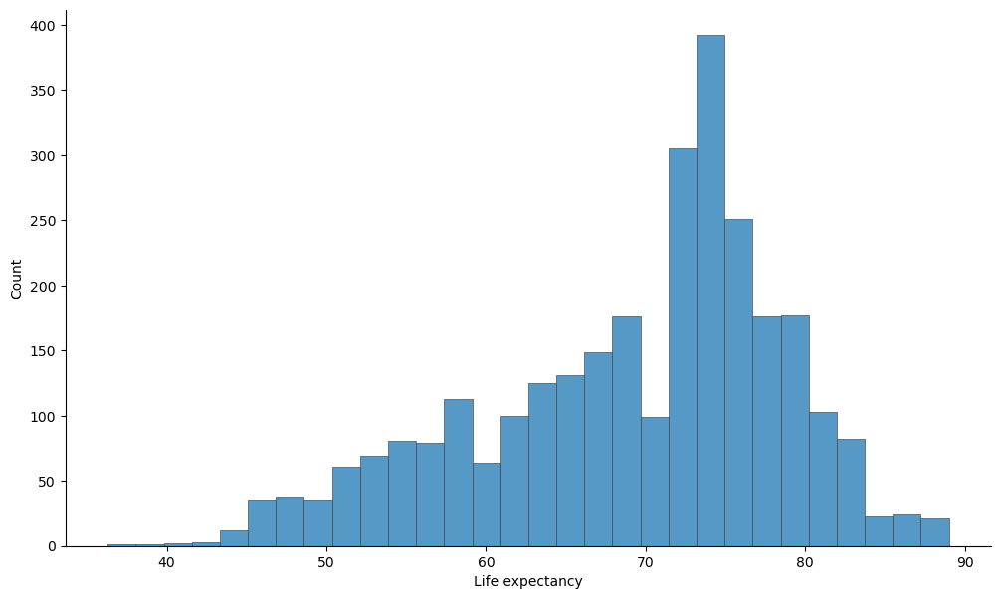

In [13]:
f, ax = plt.subplots(figsize=(12,7))
sns.despine(f)

sns.histplot(
    data,
    x="Life_expectancy", 
    palette="rainbow",
    edgecolor=".3",
    linewidth=.5,
    log_scale=False,
)
ax.xaxis.set_major_formatter(mpl.ticker.ScalarFormatter())

plt.xlabel("Life expectancy")
plt.show();

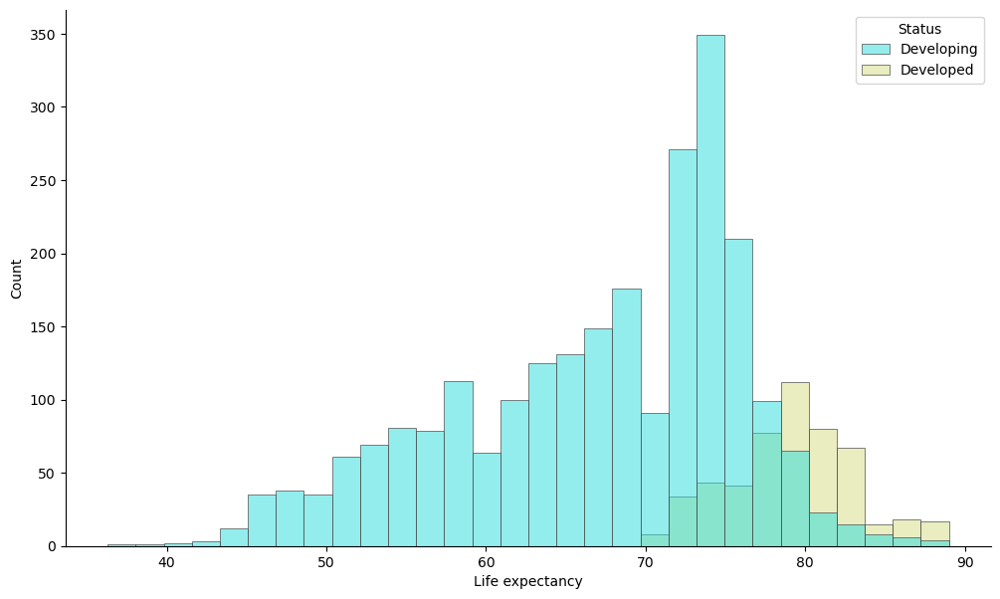

In [14]:
f, ax = plt.subplots(figsize=(12,7))
sns.despine(f)

sns.histplot(
    data,
    x="Life_expectancy", 
    palette="rainbow",
    edgecolor=".3",
    linewidth=.5,
    hue = "Status",
    log_scale=False,
)
ax.xaxis.set_major_formatter(mpl.ticker.ScalarFormatter())

plt.xlabel("Life expectancy")
plt.show();

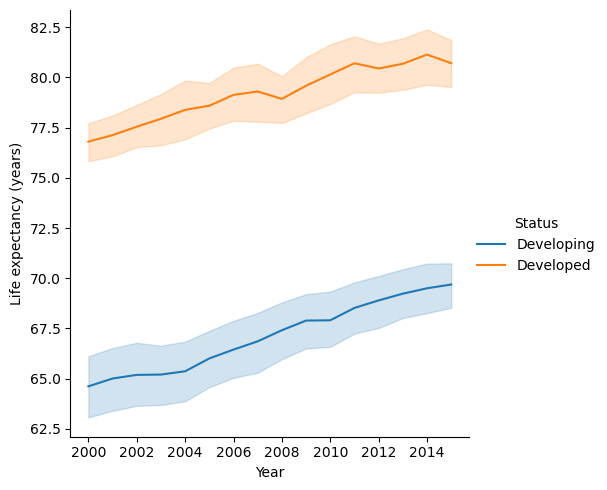

In [15]:
sns.relplot(x='Year',
            y='Life_expectancy',
            data=data,
            kind='line',
            hue='Status')
plt.ylabel("Life expectancy (years)")
plt.xlabel("Year")
plt.show();

### Country examination

In [14]:
cou_df = data[data.Year == 2015]
print(cou_df.shape)
cou_df.head()

(183, 22)


,Country,Year,Status,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,...,Polio,Total_expenditure,Diphtheria,HIV_AIDS,GDP,Population,thinness__1_19_years,thinness_5_9_years,Income_composition_of_resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
16,Albania,2015,Developing,77.8,74.0,0,4.60,364.975229,99.0,0,...,99.0,6.00,99.0,0.1,3954.227830,28873.0,1.2,1.3,0.762,14.2
32,Algeria,2015,Developing,75.6,19.0,21,NaN,0.000000,95.0,63,...,95.0,NaN,95.0,0.1,4132.762920,39871528.0,6.0,5.8,0.743,14.4
48,Angola,2015,Developing,52.4,335.0,66,NaN,0.000000,64.0,118,...,7.0,NaN,64.0,1.9,3695.793748,2785935.0,8.3,8.2,0.531,11.4
64,Antigua and Barbuda,2015,Developing,76.4,13.0,0,NaN,0.000000,99.0,0,...,86.0,NaN,99.0,0.2,13566.954100,NaN,3.3,3.3,0.784,13.9


In [15]:
cou_df = cou_df.sort_values(['Life_expectancy'], ascending = False)
top10 = list(cou_df.Country)[:10]
top20 = list(cou_df.Country)[10:20]
bot10 = list(cou_df.Country)[-10:]
print(bot10)

['Cameroon', 'South Sudan', 'Somalia', 'Nigeria', 'Lesotho', "Côte d'Ivoire", 'Chad', 'Central African Republic', 'Angola', 'Sierra Leone']


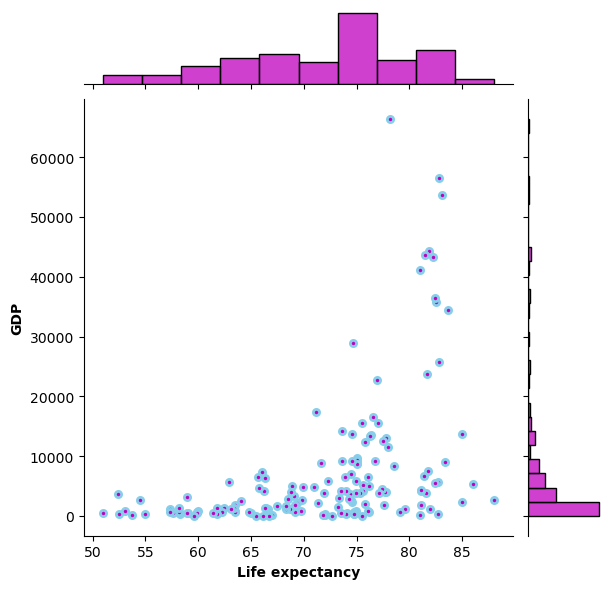

In [16]:
ax = sns.jointplot(x=cou_df['Life_expectancy'], y=cou_df['GDP'], kind='scatter', s=20, 
                   color='m', edgecolor="skyblue", linewidth=2)
ax.ax_joint.set_xlabel('Life expectancy', fontweight='bold')
ax.ax_joint.set_ylabel('GDP', fontweight='bold')
plt.show()


In [17]:
fig = px.scatter(cou_df, x='Life_expectancy', y='GDP', color="Country", size='Adult_Mortality', 
                 hover_data=['Country'], labels=dict(GDP="GDP", Life_expectancy="Life expectancy (years)", Country="Country"))
fig.update_layout(
    plot_bgcolor='white'
)
fig.show();

In [18]:
data_t10 = data[data.Country.isin(top10)]
fig = px.line(data_t10, x='Year', y='Life_expectancy', color='Country', symbol="Country",
              labels=dict(Year="Year", Life_expectancy="Life expectancy (years)", Country="Country"))
fig.update_layout(
    plot_bgcolor='white'
)
fig.show()

In [19]:
data_t20 = data[data.Country.isin(top20)]
fig = px.line(data_t20, x='Year', y='Life_expectancy', color='Country', symbol="Country",
              labels=dict(Year="Year", Life_expectancy="Life expectancy (years)", Country="Country"))
fig.update_layout(
    plot_bgcolor='white'
)
fig.show()

In [20]:
data_b10 = data[data.Country.isin(bot10)]
fig = px.line(data_b10, x='Year', y='Life_expectancy', color='Country', symbol="Country",
              labels=dict(Year="Year", Life_expectancy="Life expectancy (years)", Country="Country"))
fig.update_layout(
    plot_bgcolor='white'
)
fig.show()


1. Does various predicting factors which has been chosen initially really affect the Life expectancy? What are the predicting variables actually affecting the life expectancy?  
2. Should a country having a lower life expectancy value(<65) increase its healthcare expenditure in order to improve its average lifespan?  
3. How does Infant and Adult mortality rates affect life expectancy?  
4. Does Life Expectancy has positive or negative correlation with eating habits, lifestyle, exercise, smoking, drinking alcohol etc.  
5. What is the impact of schooling on the lifespan of humans?  
6. Does Life Expectancy have positive or negative relationship with drinking alcohol?  
7. Do densely populated countries tend to have lower life expectancy?  
8. What is the impact of Immunization coverage on life Expectancy?  

### Prediction for 2015

In [21]:
cou_c = data.groupby('Country')['Life_expectancy'].count()
cou_c = cou_c.reset_index()
cou_c = cou_c.sort_values(['Life_expectancy'])
cou_ca = cou_c[cou_c.Life_expectancy < 2]
print(list(cou_ca.Country))

['Dominica', 'Palau', 'Nauru', 'Tuvalu', 'Cook Islands', 'Marshall Islands', 'Monaco', 'Niue', 'Saint Kitts and Nevis', 'San Marino']


In [22]:
df = data[~data.Country.isin(list(cou_ca.Country))]
print(df.shape)

(2928, 22)


In [23]:
check = df.isnull().sum()
check = pd.DataFrame(check)
check.columns = ['Count']
check['perc'] = check.Count/df.shape[0]*100
check = check[check.Count > 0]
miss_lst = list(check.index)
print(miss_lst)
check

['Alcohol', 'Hepatitis_B', 'BMI', 'Polio', 'Total_expenditure', 'Diphtheria', 'GDP', 'Population', 'thinness__1_19_years', 'thinness_5_9_years', 'Income_composition_of_resources', 'Schooling']


,Count,perc
Alcohol,193,6.591530
Hepatitis_B,553,18.886612
BMI,32,1.092896
Polio,19,0.648907
Total_expenditure,226,7.718579
Diphtheria,19,0.648907
GDP,443,15.129781
Population,644,21.994536
thinness__1_19_years,32,1.092896
thinness_5_9_years,32,1.092896


In [24]:
for name in miss_lst:
    df[name + '_miss'] = 0
    df.loc[df[name].isna(),name + '_miss'] = 1

    df[name] = df.groupby(['Country']).apply(lambda x: x[name].bfill()).reset_index(drop=True)
    df[name] = df.groupby(['Country']).apply(lambda x: x[name].ffill()).reset_index(drop=True)

/var/folders/4t/t1tjs2gd7kzg3jkt5d1snhlh0000gn/T/ipykernel_5849/2293793537.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/4t/t1tjs2gd7kzg3jkt5d1snhlh0000gn/T/ipykernel_5849/2293793537.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/4t/t1tjs2gd7kzg3jkt5d1snhlh0000gn/T/ipykernel_5849/2293793537.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

/var/folders/4t/t1tjs2gd7kzg3jkt5d1snhlh0000gn/T/ipykernel_5849/2293793537.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/4t/t1tjs2gd7kzg3jkt5d1snhlh0000gn/T/ipykernel_5849/2293793537.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/4t/t1tjs2gd7kzg3jkt5d1snhlh0000gn/T/ipykernel_5849/2293793537.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu

In [25]:
check = df.isnull().sum()
check = pd.DataFrame(check)
check.columns = ['Count']
check['perc'] = check.Count/df.shape[0]*100
check = check[check.Count > 0]
check

,Count,perc
Alcohol,17,0.580601
Hepatitis_B,188,6.420765
BMI,24,0.819672
Polio,17,0.580601
Total_expenditure,39,1.331967
Diphtheria,17,0.580601
GDP,358,12.226776
Population,549,18.750000
thinness__1_19_years,24,0.819672
thinness_5_9_years,24,0.819672


### Clustering Life Expectancy

In [26]:
cou_cb = cou_c[cou_c.Life_expectancy == 16]
print(cou_cb.shape)
a = list(cou_cb.Country)
a.sort()
#print(a)

(183, 2)


In [27]:
le_df = df[['Life_expectancy','Country','Year']]
le_df = le_df[le_df.Country.isin(list(cou_cb.Country))]
le_df_p = le_df.pivot('Year', 'Country', "Life_expectancy")
le_df_p = le_df_p.sort_values(['Year'])
le_df_p = le_df_p.reset_index()
le_df_p.head()

/var/folders/4t/t1tjs2gd7kzg3jkt5d1snhlh0000gn/T/ipykernel_5849/2186493670.py:3: FutureWarning:

In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.



Country,Year,Afghanistan,Albania,Algeria,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Austria,...,United Republic of Tanzania,United States of America,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Yemen,Zambia,Zimbabwe
0,2000,54.8,72.6,71.3,45.3,73.6,74.1,72.0,79.5,78.1,...,49.2,76.8,75.1,67.1,69.0,72.5,73.4,68.0,43.8,46.0
1,2001,55.3,73.6,71.4,45.7,73.8,74.0,72.6,79.9,78.6,...,49.6,76.9,75.2,67.4,69.1,72.5,73.6,61.1,44.6,45.3
2,2002,56.2,73.3,71.6,46.5,74.0,74.1,72.6,79.9,78.7,...,52.0,77.0,75.4,67.1,69.3,73.1,73.8,61.5,45.5,44.8
3,2003,56.7,72.8,71.7,46.8,74.2,74.1,72.7,83.0,78.8,...,58.0,77.2,75.4,67.2,69.4,72.4,74.0,61.9,46.4,44.5
4,2004,57.0,73.0,72.3,47.1,74.4,74.7,73.0,86.0,79.3,...,51.5,77.5,75.4,67.8,69.6,73.3,74.2,62.2,47.9,44.3


In [28]:
check = le_df_p.isnull().sum()
check = pd.DataFrame(check)
check.columns = ['Count']
check['perc'] = check.Count/le_df_p.shape[0]*100
check[check.Count > 0]

,Count,perc
Country,,


In [29]:
data_array = np.array(le_df_p.T.drop('Year').values)

model = TimeSeriesKMeans(n_clusters = 20, metric="dtw", max_iter=10)
model.fit(data_array)
cities_list = le_df_p.T.drop('Year').index.tolist()
#print(cities_list)

In [30]:
y = model.predict(data_array)

/Users/keithlowton/anaconda3/envs/Regressions/lib/python3.10/site-packages/tslearn/utils/utils.py:90: UserWarning:

2-Dimensional data passed. Assuming these are 183 1-dimensional timeseries



In [31]:
clust_df = pd.DataFrame(y, columns = ['Cluster'])
clust_df['Country'] = cities_list
clust_dfa = pd.merge(le_df, clust_df, how = 'left', on = 'Country')
clust_dfa.head()

,Life_expectancy,Country,Year,Cluster
0,65.0,Afghanistan,2015,17
1,59.9,Afghanistan,2014,17
2,59.9,Afghanistan,2013,17
3,59.5,Afghanistan,2012,17
4,59.2,Afghanistan,2011,17


In [32]:
for i in range(clust_dfa.Cluster.max()):
    plot_df = clust_dfa[clust_dfa.Cluster == i]
    fig = px.line(plot_df, x='Year', y='Life_expectancy', color='Country', symbol="Country",
                  labels=dict(Year="Year", Life_expectancy="Life expectancy (years)", Country="Country"))
    fig.update_layout(
        plot_bgcolor='white'
    )
    fig.update_layout(yaxis_range=[round((int(clust_dfa.Life_expectancy.min()) - 2)/10)*10,
                                   round((int(clust_dfa.Life_expectancy.max()) + 10)/10)*10])
    fig.show()


### Infilling of data

In [33]:
print(df.shape)

(2928, 34)


In [34]:
clust_dfb = clust_dfa[['Cluster','Country']].drop_duplicates()
print(clust_dfb.shape)

(183, 2)


In [35]:
dfa = df.copy()
print(dfa.shape)
dfa = pd.merge(dfa, clust_dfb, how = 'left', on = 'Country')
dfa.Cluster = dfa.Cluster.astype(str)
print(dfa.shape)
for name in miss_lst:
    #dfa["value"] = df.groupby("name").transform(lambda x: x.fillna(x.mean()))
    dfa[name] = dfa[name].fillna(dfa.groupby('Cluster')[name].transform('mean'))

(2928, 34)
(2928, 35)


In [36]:
check = dfa.isnull().sum()
check = pd.DataFrame(check)
check.columns = ['Count']
check['perc'] = check.Count/dfa.shape[0]*100
check[check.Count > 0]

,Count,perc


### New features

In [37]:
# Adult_Mortality           1.322175
# thinness__1_19_years      0.661570
# HIV_AIDS                  0.501454
# Schooling                 0.479918
# under_five_deaths         0.441819
# BMI                       0.411170
# Alcohol                   0.362024
# Cluster_6                 0.330150
# percentage_expenditure    0.329871



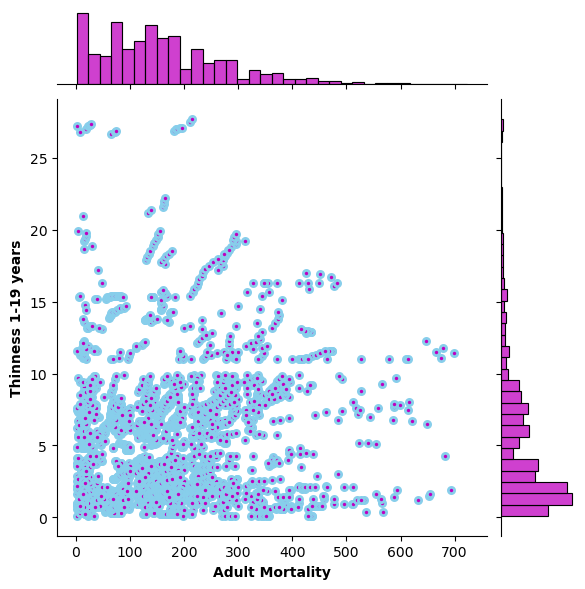

In [38]:
ax = sns.jointplot(x=df['Adult_Mortality'], y=df['thinness__1_19_years'], kind='scatter', s=20, color='m', edgecolor="skyblue", linewidth=2)
ax.ax_joint.set_xlabel('Adult Mortality', fontweight='bold')
ax.ax_joint.set_ylabel('Thinness 1-19 years', fontweight='bold')
plt.show()

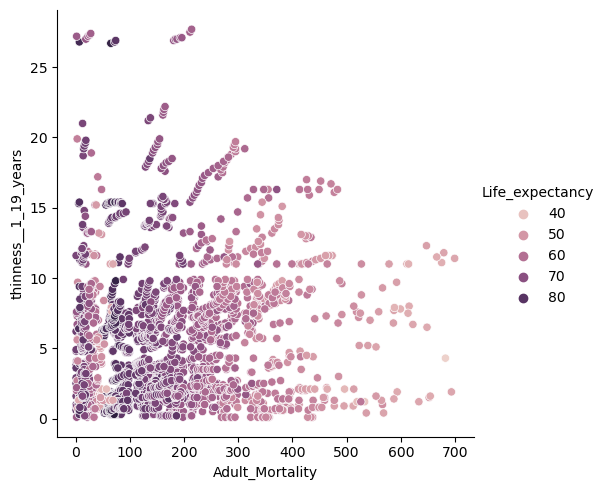

In [39]:
sns.relplot(x='Adult_Mortality',
            y='thinness__1_19_years',
            data=df,
            kind='scatter',
            hue='Life_expectancy');
plt.show();

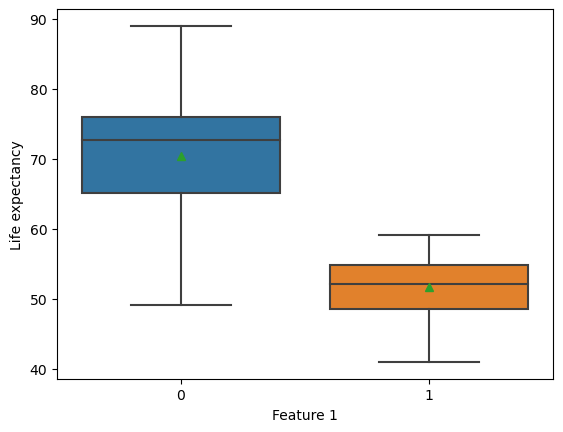

col_0,Count
feature_1,
0,2736
1,192


In [44]:
dfa['feature_1'] = 0
dfa.loc[(dfa.Adult_Mortality > 350) & (dfa.thinness__1_19_years < 10),'feature_1'] = 1

sns.boxplot(data=dfa, x="feature_1", y="Life_expectancy", showfliers = False, showmeans = True)
plt.xlabel("Feature 1")
plt.ylabel("Life expectancy")
plt.show()
pd.crosstab(dfa['feature_1'], columns = 'Count')

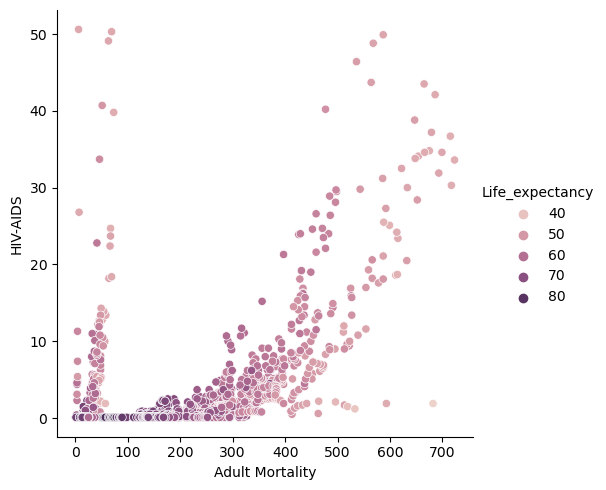

In [45]:
sns.relplot(x='Adult_Mortality',
            y='HIV_AIDS',
            data=df,
            kind='scatter',
            hue='Life_expectancy')
plt.xlabel('Adult Mortality')
plt.ylabel('HIV-AIDS')
plt.show();

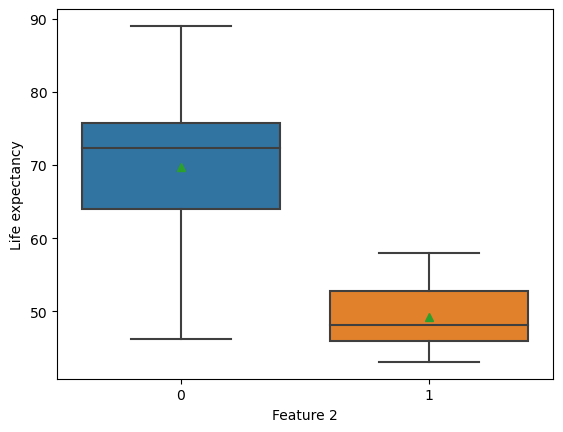

col_0,Count
feature_2,
0,2862
1,66


In [46]:
dfa['feature_2'] = 0
dfa.loc[(dfa.Adult_Mortality > 450) & (dfa.HIV_AIDS > 10),'feature_2'] = 1

sns.boxplot(data=dfa, x="feature_2", y="Life_expectancy", showfliers = False, showmeans = True)
plt.xlabel("Feature 2")
plt.ylabel("Life expectancy")
plt.show()
pd.crosstab(dfa['feature_2'], columns = 'Count')

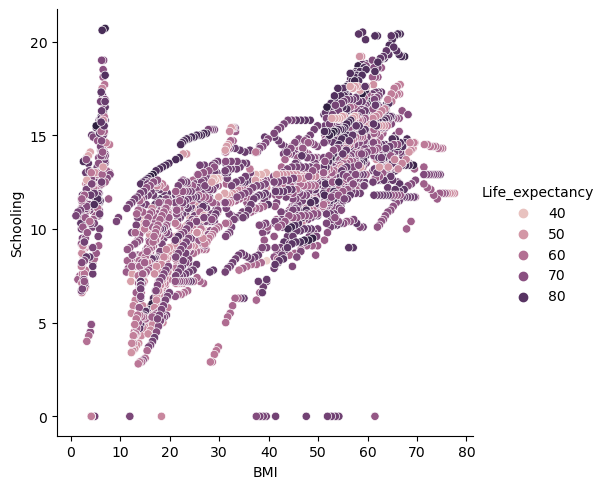

In [47]:
sns.relplot(x='BMI',
            y='Schooling',
            data=df,
            kind='scatter',
            hue='Life_expectancy');
plt.show();

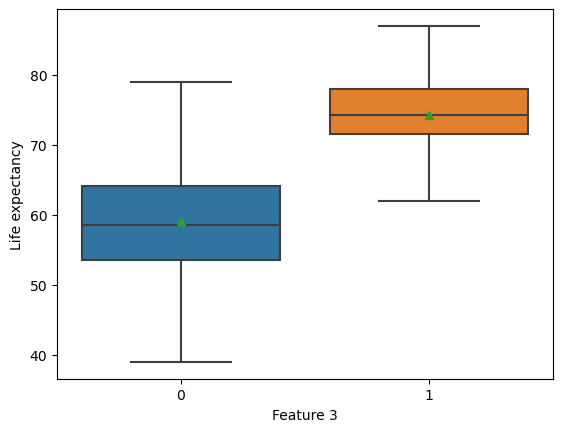

col_0,Count
feature_3,
0,980
1,1948


In [48]:
dfa['feature_3'] = 0
dfa.loc[(dfa.HIV_AIDS < 0.4) & ((dfa.Adult_Mortality < 260.6) | (dfa.Adult_Mortality > 331.9)),'feature_3'] = 1

sns.boxplot(data=dfa, x="feature_3", y="Life_expectancy", showfliers = False, showmeans = True)
plt.xlabel("Feature 3")
plt.ylabel("Life expectancy")
plt.show()
pd.crosstab(dfa['feature_3'], columns = 'Count')


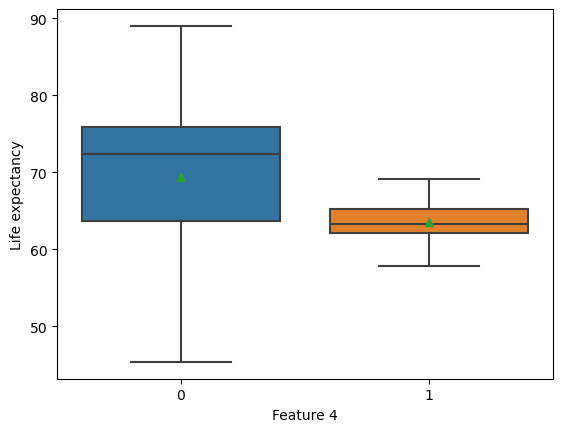

col_0,Count
feature_4,
0,2827
1,101


In [49]:
dfa['feature_4'] = 0
dfa.loc[(dfa.HIV_AIDS > 0.4) & (dfa.Adult_Mortality > 216) & (dfa.Adult_Mortality < 260.6),'feature_4'] = 1

sns.boxplot(data=dfa, x="feature_4", y="Life_expectancy", showfliers = False, showmeans = True)
plt.xlabel("Feature 4")
plt.ylabel("Life expectancy")
plt.show()
pd.crosstab(dfa['feature_4'], columns = 'Count')

### Model data

In [50]:
print(dfa.shape)
print(list(dfa.columns))
dfa.head()

(2928, 39)
['Country', 'Year', 'Status', 'Life_expectancy', 'Adult_Mortality', 'infant_deaths', 'Alcohol', 'percentage_expenditure', 'Hepatitis_B', 'Measles', 'BMI', 'under_five_deaths', 'Polio', 'Total_expenditure', 'Diphtheria', 'HIV_AIDS', 'GDP', 'Population', 'thinness__1_19_years', 'thinness_5_9_years', 'Income_composition_of_resources', 'Schooling', 'Alcohol_miss', 'Hepatitis_B_miss', 'BMI_miss', 'Polio_miss', 'Total_expenditure_miss', 'Diphtheria_miss', 'GDP_miss', 'Population_miss', 'thinness__1_19_years_miss', 'thinness_5_9_years_miss', 'Income_composition_of_resources_miss', 'Schooling_miss', 'Cluster', 'feature_1', 'feature_2', 'feature_3', 'feature_4']


,Country,Year,Status,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,...,Population_miss,thinness__1_19_years_miss,thinness_5_9_years_miss,Income_composition_of_resources_miss,Schooling_miss,Cluster,feature_1,feature_2,feature_3,feature_4
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,0,0,0,0,0,17,0,0,0,0
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,0,0,0,0,0,17,0,0,0,0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,0,0,0,0,0,17,0,0,0,0
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,0,0,0,0,0,17,0,0,0,0
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,0,0,0,0,0,17,0,0,0,0


In [51]:
country_df = dfa.Country.drop_duplicates()
country_df = country_df.reset_index(drop=True)
print(country_df.shape)
country_df_test = list(country_df.sample(int(country_df.shape[0]/3), replace=False))
print(country_df_test, len(country_df_test))

(183,)
['United Kingdom of Great Britain and Northern Ireland', 'Bolivia (Plurinational State of)', 'Sudan', 'Algeria', 'Australia', 'Lesotho', 'Belgium', 'Timor-Leste', 'Gambia', 'Sri Lanka', 'Canada', 'Cabo Verde', 'Central African Republic', 'Cyprus', 'Malawi', 'Mali', 'France', 'Libya', 'Luxembourg', 'Bahrain', 'Saudi Arabia', 'Kazakhstan', 'Azerbaijan', 'Austria', 'Saint Vincent and the Grenadines', 'Togo', 'Brunei Darussalam', 'Haiti', 'Republic of Moldova', 'Republic of Korea', 'Ireland', 'Bhutan', 'El Salvador', 'Philippines', 'Poland', "Democratic People's Republic of Korea", 'Jamaica', 'South Africa', 'Germany', 'Czechia', 'Bulgaria', 'Madagascar', 'Belize', 'Namibia', 'Vanuatu', 'Mongolia', 'Turkmenistan', 'Peru', 'Oman', 'Malta', 'Dominican Republic', 'Slovakia', 'Italy', 'United Arab Emirates', 'Indonesia', 'Angola', 'Portugal', 'Guyana', 'Bosnia and Herzegovina', 'Belarus', 'Kiribati'] 61


In [52]:
print(dfa.shape)

(2928, 39)


In [53]:
test = dfa[dfa.Country.isin(country_df_test)]
train = dfa[~dfa.Country.isin(country_df_test)]
y_train = train.Life_expectancy
y_test = test.Life_expectancy
X_train = train.drop(['Life_expectancy'], axis = 1)
X_test = test.drop(['Life_expectancy'], axis = 1)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(1952, 38) (976, 38) (1952,) (976,)


### Binning data

In [132]:
num_cols = X_train.select_dtypes(include=np.number).columns.tolist()
num_cols = num_cols + ['Life_expectancy']

X_train_b = pd.concat([X_train,y_train], axis = 1)

for m_val in num_cols:
    X_train_b[m_val + '_bin'], bin_edges  = pd.qcut(X_train_b[m_val],
                                                   q = [0, .1, .2, .3, .4, .5, .6, .7, .8, .9, 1],
                                                   retbins = True,
                                                   duplicates = 'drop')
    print(m_val, bin_edges,range(len(bin_edges)-1))

    X_train_b[m_val + '_bin']  = pd.cut(X_train_b[m_val],
                                       bins = bin_edges,
                                       labels = range(len(bin_edges)-1),
                                       duplicates = 'drop',
                                       include_lowest=True)
    X_train_b[m_val + '_bin']  = X_train_b[m_val + '_bin'].astype(str)
    X_train_b.loc[X_train_b[m_val + '_bin'] == 'nan',m_val + '_bin'] = 'Missing'

Year [2000.  2001.  2003.  2004.  2006.  2007.5 2009.  2011.  2012.  2014.
 2015. ] range(0, 10)
Adult_Mortality [  1.   18.   63.   84.  118.  138.5 171.  216.  260.6 331.9 723. ] range(0, 10)
infant_deaths [  0.    1.    2.    3.    8.   19.7  33.   63.  490. ] range(0, 8)
Alcohol [1.00000000e-02 2.60000000e-01 1.03600000e+00 2.02400000e+00
 3.46442857e+00 5.03000000e+00 6.89700000e+00 8.48800000e+00
 1.06780000e+01 1.78700000e+01] range(0, 9)
percentage_expenditure [0.00000000e+00 1.07595705e+01 3.55136697e+01 6.25234670e+01
 1.35945692e+02 2.73559448e+02 5.78738459e+02 1.71171602e+03
 1.52680644e+04] range(0, 8)
Hepatitis_B [ 2. 28. 64. 76. 82. 88. 92. 95. 97. 98. 99.] range(0, 10)
Measles [0.00000e+00 5.00000e+00 2.30000e+01 7.56000e+01 2.64700e+02 8.82600e+02
 4.31370e+03 1.82485e+05] range(0, 7)
BMI [ 1.   12.21 17.5  22.2  29.   42.4  49.7  54.8  57.58 61.9  77.6 ] range(0, 10)
under_five_deaths [  0.   1.   2.   4.  10.  25.  47.  94. 608.] range(0, 8)
Polio [ 3. 52. 73. 82. 8

In [121]:
cat_cols = X_train.select_dtypes(include=np.object).columns.tolist()
print(cat_cols)

['Country', 'Status', 'Cluster']


/var/folders/4t/t1tjs2gd7kzg3jkt5d1snhlh0000gn/T/ipykernel_1024/382932747.py:1: DeprecationWarning:

`np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



In [122]:
bin_m_data = [col for col in X_train_b.columns if '_bin' in col and '_miss_' not in col]
print(bin_m_data)
X_train_b[bin_m_data + cat_cols].head()

['Year_bin', 'Adult_Mortality_bin', 'infant_deaths_bin', 'Alcohol_bin', 'percentage_expenditure_bin', 'Hepatitis_B_bin', 'Measles_bin', 'BMI_bin', 'under_five_deaths_bin', 'Polio_bin', 'Total_expenditure_bin', 'Diphtheria_bin', 'HIV_AIDS_bin', 'GDP_bin', 'Population_bin', 'thinness__1_19_years_bin', 'thinness_5_9_years_bin', 'Income_composition_of_resources_bin', 'Schooling_bin', 'Life_expectancy_bin']


,Year_bin,Adult_Mortality_bin,infant_deaths_bin,Alcohol_bin,percentage_expenditure_bin,Hepatitis_B_bin,Measles_bin,BMI_bin,under_five_deaths_bin,Polio_bin,...,GDP_bin,Population_bin,thinness__1_19_years_bin,thinness_5_9_years_bin,Income_composition_of_resources_bin,Schooling_bin,Life_expectancy_bin,Country,Status,Cluster
0,9,8,6,0,3,2,5,2,6,0,...,2,9,9,9,2,2,3,Afghanistan,Developing,7
1,8,8,7,0,3,1,4,2,6,1,...,2,2,9,9,2,2,2,Afghanistan,Developing,7
2,8,8,7,0,3,1,4,2,6,1,...,2,9,9,9,2,2,2,Afghanistan,Developing,7
3,7,8,7,0,3,2,5,2,6,1,...,2,5,9,9,2,2,1,Afghanistan,Developing,7
4,6,8,7,0,0,2,5,1,7,1,...,0,4,9,9,1,2,1,Afghanistan,Developing,7


In [123]:
pd.crosstab(X_train_b.Life_expectancy_bin, columns = 'Count')
X_train_b.loc[(X_train_b.Life_expectancy_bin.isin(['0','1'])),'Life_expectancy_class'] = 0
X_train_b.loc[(X_train_b.Life_expectancy_bin.isin(['8','9'])),'Life_expectancy_class'] = 1
pd.crosstab(X_train_b.Life_expectancy_class, columns = 'Count')

col_0,Count
Life_expectancy_class,
0.0,391
1.0,390


In [124]:
bin_m_data.remove('Life_expectancy_bin')
cat_cols.remove('Country')
a = bin_m_data + cat_cols
a.sort()
print(a)

['Adult_Mortality_bin', 'Alcohol_bin', 'BMI_bin', 'Cluster', 'Diphtheria_bin', 'GDP_bin', 'HIV_AIDS_bin', 'Hepatitis_B_bin', 'Income_composition_of_resources_bin', 'Measles_bin', 'Polio_bin', 'Population_bin', 'Schooling_bin', 'Status', 'Total_expenditure_bin', 'Year_bin', 'infant_deaths_bin', 'percentage_expenditure_bin', 'thinness_5_9_years_bin', 'thinness__1_19_years_bin', 'under_five_deaths_bin']


In [125]:
print(X_train_b.shape)
X_train_b = X_train_b[~X_train_b.Life_expectancy_class.isna()]
print(X_train_b.shape)
y = X_train_b.Life_expectancy_class
X = X_train_b[bin_m_data + cat_cols]


(1952, 68)
(781, 68)


In [126]:
ohe = OneHotEncoder()

ohe.fit(X)
colnames = ohe.get_feature_names_out(list(X.columns))

bin_data_train = ohe_dset(X,list(X.columns)) 
print(bin_data_train.shape)

(781, 190)
(781, 190)


In [127]:
clf = DecisionTreeClassifier(max_depth=5, random_state=1234)
model = clf.fit(bin_data_train, y)

In [128]:
text_representation = tree.export_text(clf, feature_names=list(bin_data_train.columns))

In [129]:
rule_lst = []
flattened_lst = []

minutes = 1
t_end = time.time() + 60 * minutes

while time.time() < t_end:
    rules, proba = get_rules(clf, list(bin_data_train.columns), [0,1], 80, 40)
    rule_lst.append(list(set(rules)))
    flattened_lst = [val for sublist in rule_lst for val in sublist]
    flattened_lst = list(set(flattened_lst))

In [130]:
flattened_lst

['if (HIV_AIDS_bin_0 > 0.5) and (Adult_Mortality_bin_8 <= 0.5) and (Cluster_7 <= 0.5) then class: 1 (proba: 100.0%) | based on 389 samples',
 'if (HIV_AIDS_bin_0 <= 0.5) and (Adult_Mortality_bin_5 <= 0.5) then class: 0 (proba: 100.0%) | based on 367 samples']

### Numeric data

In [54]:
#########################################
### Check for single non varying data ###
#########################################

lst = []
for name in list(X_train.columns):
    if (X_train[name].nunique() == 1):
        lst.append(name)

print(lst)

[]


In [55]:
#########################
### Multicollinearity ###
#########################

num_cols = X_train.select_dtypes(include=np.number).columns.tolist()

vif = calculate_vif(X_train[num_cols])

a = vif[(vif.VIF > 10)]
to_drop_vif = list(a.Features)
print(to_drop_vif)
a

['Year', 'infant_deaths', 'Hepatitis_B', 'under_five_deaths', 'Polio', 'Diphtheria', 'thinness__1_19_years', 'thinness_5_9_years', 'Income_composition_of_resources', 'Schooling', 'BMI_miss', 'Polio_miss', 'Diphtheria_miss', 'thinness__1_19_years_miss', 'thinness_5_9_years_miss', 'Income_composition_of_resources_miss', 'Schooling_miss']


/Users/keithlowton/anaconda3/envs/Regressions/lib/python3.10/site-packages/statsmodels/stats/outliers_influence.py:195: RuntimeWarning:

divide by zero encountered in double_scalars



,Features,VIF
0,Year,53.512440
2,infant_deaths,196.596634
5,Hepatitis_B,15.138904
8,under_five_deaths,198.861068
9,Polio,27.945008
11,Diphtheria,31.259184
15,thinness__1_19_years,25.046668
16,thinness_5_9_years,24.331421
17,Income_composition_of_resources,29.914455
18,Schooling,50.972884


/var/folders/4t/t1tjs2gd7kzg3jkt5d1snhlh0000gn/T/ipykernel_5849/57321745.py:14: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



['under_five_deaths', 'thinness__1_19_years']


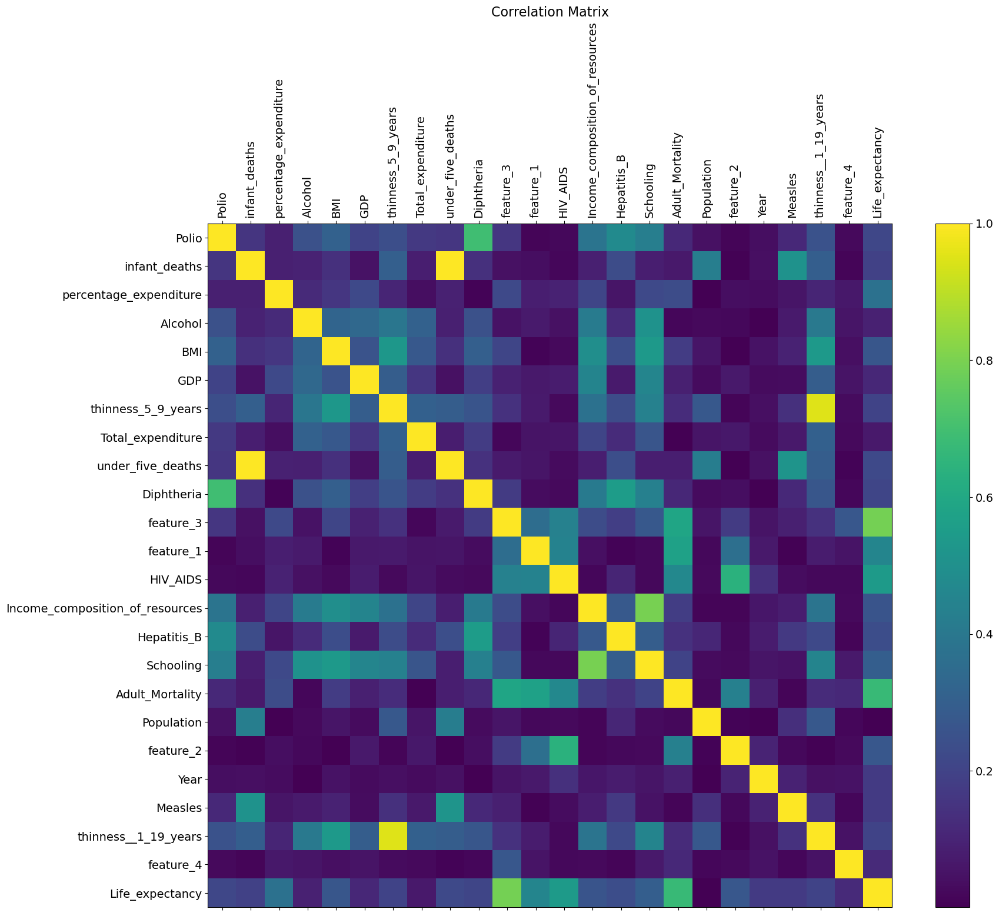

In [56]:
###################
### Correlation ###
###################

num_cols = list(X_train.select_dtypes(include=['number'], exclude=['datetime', 'timedelta']).columns)
num_cols = (list(set(num_cols) - set([col for col in X_train.columns if '_miss' in col])))
#num_cols = (list(set(num_cols) - set([col for col in X_train.columns if 'feature_' in col])))

corre_data = pd.concat([X_train[num_cols],
                        pd.DataFrame(y_train)],
                       axis = 1)

cor_matrix = corre_data.corr().abs()
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))

to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.8)]
print(to_drop)

f = plt.figure(figsize=(19, 15))
plt.matshow(cor_matrix, fignum=f.number)
plt.xticks(range(corre_data.select_dtypes(['number']).shape[1]),
           corre_data.select_dtypes(['number']).columns, fontsize=14, rotation=90)
plt.yticks(range(corre_data.select_dtypes(['number']).shape[1]),
           corre_data.select_dtypes(['number']).columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16)
plt.show();

In [57]:
try:
    X_train = X_train.drop(to_drop, axis=1)
    X_test = X_test.drop(to_drop, axis=1)
except:
    X_train = X_train
    X_test = X_test

In [58]:
#####################
### MinMax scaler ###
#####################

num_cols = list(X_train.select_dtypes(include=['number'], exclude=['datetime', 'timedelta']).columns)
num_cols = (list(set(num_cols) - set([col for col in X_train.columns if '_miss' in col])))
num_cols = (list(set(num_cols) - set([col for col in X_train.columns if 'feature_' in col])))

print(X_train[num_cols].shape)

transformer_train = MinMaxScaler().fit(X_train[num_cols])
num_data_train = pd.DataFrame(transformer_train.transform(X_train[num_cols]))
num_data_train.columns = num_cols
print(num_data_train.shape)

num_data_test = minmax_dset(X_test,num_cols) ### Test ###

(1952, 17)
(1952, 17)
(976, 17)


### Categorical data

In [59]:
cat_cols = list(X_train.select_dtypes(include=['object']))
print(cat_cols)
cat_cols.remove('Country')
print(cat_cols)

['Country', 'Status', 'Cluster']
['Status', 'Cluster']


In [60]:
###################################
### High cardinality adjustment ###
###################################

card_vars = []
cat_data = X_train[cat_cols]
for i in range(cat_data.shape[1]):
    X_train.loc[X_train[cat_data.columns[i]].isnull(),cat_data.columns[i]] = 'Missing'
    X_test.loc[X_test[cat_data.columns[i]].isnull(),cat_data.columns[i]] = 'Missing'

    if (cat_data.iloc[:,i].nunique() > 60): 
        print(cat_data.columns[i],len(list(set(cat_data.iloc[:,i]))))

        a = pd.crosstab(cat_data[cat_data.columns[i]],columns='Count')
        a = pd.DataFrame(a).sort_values('Count',ascending=False).reset_index()
        val_list = list(a.iloc[:20,0])
        X_train.loc[~X_train[cat_data.columns[i]].isin(val_list),cat_data.columns[i]] = 'Other'
        X_test.loc[~X_test[cat_data.columns[i]].isin(val_list),cat_data.columns[i]] = 'Other'

    if (len(list(set(cat_data.iloc[:,i]))) > 100):
        card_vars.append(cat_data.columns[i])

print(card_vars)

[]


In [61]:
########################
### One hot encoding ###
########################

ohe = OneHotEncoder()
print(X_train.shape)
# (1808, 10)

### Train ###

ohe.fit(X_train[cat_cols])
colnames = ohe.get_feature_names_out(cat_cols)

cat_data_train = ohe_dset(X_train,cat_cols)  ### Train ###
cat_data_test = ohe_dset(X_test,cat_cols)    ### Test ###

cat_data_train = cat_data_train.drop(['Status_Developing'], axis = 1)
cat_data_test = cat_data_test.drop(['Status_Developing'], axis = 1)

(1952, 36)
(1952, 21)
(976, 19)


### Binned data

In [62]:
bin_data_cols = [col for col in X_train.columns if '_miss' in col] + [col for col in X_train.columns if 'feature_' in col]
bin_data_train = X_train[bin_data_cols]
bin_data_test = X_test[bin_data_cols]
print(bin_data_cols)
print(bin_data_train.shape)

['Alcohol_miss', 'Hepatitis_B_miss', 'BMI_miss', 'Polio_miss', 'Total_expenditure_miss', 'Diphtheria_miss', 'GDP_miss', 'Population_miss', 'thinness__1_19_years_miss', 'thinness_5_9_years_miss', 'Income_composition_of_resources_miss', 'Schooling_miss', 'feature_1', 'feature_2', 'feature_3', 'feature_4']
(1952, 16)


In [63]:
print(list(cat_data_train.columns))
print(list(num_data_train.columns))
print(list(bin_data_train.columns))

['Status_Developed', 'Cluster_0', 'Cluster_1', 'Cluster_10', 'Cluster_11', 'Cluster_12', 'Cluster_13', 'Cluster_14', 'Cluster_15', 'Cluster_16', 'Cluster_17', 'Cluster_18', 'Cluster_19', 'Cluster_2', 'Cluster_3', 'Cluster_4', 'Cluster_5', 'Cluster_6', 'Cluster_7', 'Cluster_8']
['Polio', 'Income_composition_of_resources', 'infant_deaths', 'percentage_expenditure', 'Alcohol', 'BMI', 'GDP', 'thinness_5_9_years', 'Hepatitis_B', 'Total_expenditure', 'Schooling', 'Diphtheria', 'Adult_Mortality', 'Population', 'Year', 'Measles', 'HIV_AIDS']
['Alcohol_miss', 'Hepatitis_B_miss', 'BMI_miss', 'Polio_miss', 'Total_expenditure_miss', 'Diphtheria_miss', 'GDP_miss', 'Population_miss', 'thinness__1_19_years_miss', 'thinness_5_9_years_miss', 'Income_composition_of_resources_miss', 'Schooling_miss', 'feature_1', 'feature_2', 'feature_3', 'feature_4']


In [64]:
###########################
### Bring data together ###
###########################

print(cat_data_train.shape, num_data_train.shape, bin_data_train.shape)
cat_data_train = cat_data_train.reset_index()
num_data_train = num_data_train.reset_index()
bin_data_train = bin_data_train.reset_index()

X_train = pd.concat([cat_data_train,num_data_train],axis = 1)
print(X_train.shape)
X_train = pd.concat([X_train,bin_data_train],axis = 1)
print(X_train.shape)

print(cat_data_test.shape, num_data_test.shape, bin_data_test.shape)
cat_data_test = cat_data_test.reset_index()
num_data_test = num_data_test.reset_index()
bin_data_test = bin_data_test.reset_index()
X_test = pd.concat([cat_data_test,num_data_test],axis = 1)
X_test = pd.concat([X_test,bin_data_test],axis = 1)

print(X_train.shape, X_test.shape)

# (64215, 105) (42811, 103) (10148, 89)

(1952, 20) (1952, 17) (1952, 16)
(1952, 39)
(1952, 56)
(976, 18) (976, 17) (976, 16)
(1952, 56) (976, 54)


In [65]:
####################################################
### Check that train/test sets have same columns ###
####################################################

mod_cols = (list(set(list(X_train.columns)) - set(['index'])))
X_train = X_train[mod_cols]
miss_lst = list(set(list(X_train.columns)) - set(list(X_test.columns)))

for name in miss_lst:
    X_test[name] = 0
X_test = X_test[list(X_train.columns)]

drop_test_lst = list(set(list(X_test.columns)) - set(list(X_train.columns)))
X_test = X_test.drop(drop_test_lst, axis = 1)

print(X_train.shape, X_test.shape)
# (64215, 105) (42811, 135) (10148, 107)

(1952, 53) (976, 53)


### Mutual information check

In [66]:
mutual_info = mutual_info_regression(X_train, y_train)
mutual_info = pd.Series(mutual_info)
mutual_info.index = X_train.columns

In [175]:
mutual_info = mutual_info.sort_values(ascending=False)
mutual_info[:20]

Adult_Mortality           1.373551
thinness__1_19_years      0.584536
HIV_AIDS                  0.524230
under_five_deaths         0.468769
BMI                       0.389965
Schooling                 0.382676
feature_3                 0.366733
Cluster_3                 0.364833
Alcohol                   0.324939
percentage_expenditure    0.313010
Cluster_6                 0.260104
GDP                       0.227744
Total_expenditure         0.218407
Hepatitis_B               0.205474
Cluster_1                 0.194748
Population                0.191607
Status_Developed          0.189379
Diphtheria                0.145898
Polio                     0.144303
Measles                   0.143712
dtype: float64

<Axes: >

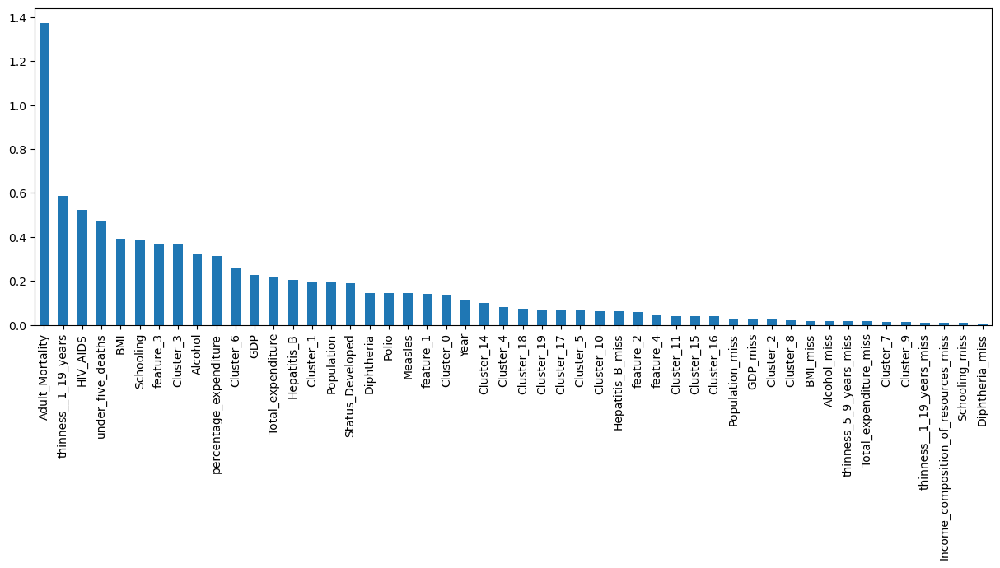

In [176]:
mutual_info[:50].sort_values(ascending=False).plot.bar(figsize=(15,5))

### Models

#### Gradient Boosting Regressor

In [67]:
gbr = GradientBoostingRegressor(random_state=0)

In [68]:
GradientBoostingRegressor().get_params().keys()

dict_keys(['alpha', 'ccp_alpha', 'criterion', 'init', 'learning_rate', 'loss', 'max_depth', 'max_features', 'max_leaf_nodes', 'min_impurity_decrease', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'n_estimators', 'n_iter_no_change', 'random_state', 'subsample', 'tol', 'validation_fraction', 'verbose', 'warm_start'])

In [69]:
gbr_param_grid = {
    'learning_rate': [0.1, 0.05, 0.01],
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 4, 8],
    'min_samples_leaf': [1, 2, 4]
}

gbr_gridsearch = GridSearchCV(gbr, gbr_param_grid, cv = 5, verbose = 2)

gbr_gridsearch.fit(X_train, y_train)

print("Best parameters: ", gbr_gridsearch.best_params_)
# Best parameters:  {'learning_rate': 0.1, 'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}
print("Cross Validation Score: ", gbr_gridsearch.best_score_)

Fitting 5 folds for each of 243 candidates, totalling 1215 fits
[CV] END learning_rate=0.1, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END learning_rate=0.1, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END learning_rate=0.1, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END learning_rate=0.1, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END learning_rate=0.1, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END learning_rate=0.1, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.5s
[CV] END learning_rate=0.1, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.6s
[CV] END learning_rate=0.1, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total ti

[CV] END learning_rate=0.1, max_depth=3, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.5s
[CV] END learning_rate=0.1, max_depth=3, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   1.0s
[CV] END learning_rate=0.1, max_depth=3, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   1.0s
[CV] END learning_rate=0.1, max_depth=3, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   1.1s
[CV] END learning_rate=0.1, max_depth=3, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   1.0s
[CV] END learning_rate=0.1, max_depth=3, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   1.0s
[CV] END learning_rate=0.1, max_depth=3, min_samples_leaf=2, min_samples_split=8, n_estimators=50; total time=   0.3s
[CV] END learning_rate=0.1, max_depth=3, min_samples_leaf=2, min_samples_split=8, n_estimators=50; total time=   0.3s
[CV] END learning_rate=0.1, max_depth=3, min_sampl

[CV] END learning_rate=0.1, max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.5s
[CV] END learning_rate=0.1, max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.9s
[CV] END learning_rate=0.1, max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.9s
[CV] END learning_rate=0.1, max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END learning_rate=0.1, max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.9s
[CV] END learning_rate=0.1, max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.9s
[CV] END learning_rate=0.1, max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.7s
[CV] END learning_rate=0.1, max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.7s
[CV] END learning_rate=0.1, max_depth=5, min_samp

[CV] END learning_rate=0.1, max_depth=5, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   1.7s
[CV] END learning_rate=0.1, max_depth=5, min_samples_leaf=2, min_samples_split=8, n_estimators=50; total time=   0.4s
[CV] END learning_rate=0.1, max_depth=5, min_samples_leaf=2, min_samples_split=8, n_estimators=50; total time=   0.4s
[CV] END learning_rate=0.1, max_depth=5, min_samples_leaf=2, min_samples_split=8, n_estimators=50; total time=   0.4s
[CV] END learning_rate=0.1, max_depth=5, min_samples_leaf=2, min_samples_split=8, n_estimators=50; total time=   0.4s
[CV] END learning_rate=0.1, max_depth=5, min_samples_leaf=2, min_samples_split=8, n_estimators=50; total time=   0.4s
[CV] END learning_rate=0.1, max_depth=5, min_samples_leaf=2, min_samples_split=8, n_estimators=100; total time=   0.9s
[CV] END learning_rate=0.1, max_depth=5, min_samples_leaf=2, min_samples_split=8, n_estimators=100; total time=   0.9s
[CV] END learning_rate=0.1, max_depth=5, min_samples_

[CV] END learning_rate=0.1, max_depth=7, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   1.2s
[CV] END learning_rate=0.1, max_depth=7, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.5s
[CV] END learning_rate=0.1, max_depth=7, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.5s
[CV] END learning_rate=0.1, max_depth=7, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.3s
[CV] END learning_rate=0.1, max_depth=7, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.3s
[CV] END learning_rate=0.1, max_depth=7, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   2.3s
[CV] END learning_rate=0.1, max_depth=7, min_samples_leaf=1, min_samples_split=4, n_estimators=50; total time=   0.6s
[CV] END learning_rate=0.1, max_depth=7, min_samples_leaf=1, min_samples_split=4, n_estimators=50; total time=   0.6s
[CV] END learning_rate=0.1, max_depth=7, min_sampl

[CV] END learning_rate=0.1, max_depth=7, min_samples_leaf=2, min_samples_split=8, n_estimators=50; total time=   0.6s
[CV] END learning_rate=0.1, max_depth=7, min_samples_leaf=2, min_samples_split=8, n_estimators=100; total time=   1.2s
[CV] END learning_rate=0.1, max_depth=7, min_samples_leaf=2, min_samples_split=8, n_estimators=100; total time=   1.2s
[CV] END learning_rate=0.1, max_depth=7, min_samples_leaf=2, min_samples_split=8, n_estimators=100; total time=   1.2s
[CV] END learning_rate=0.1, max_depth=7, min_samples_leaf=2, min_samples_split=8, n_estimators=100; total time=   1.1s
[CV] END learning_rate=0.1, max_depth=7, min_samples_leaf=2, min_samples_split=8, n_estimators=100; total time=   1.1s
[CV] END learning_rate=0.1, max_depth=7, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   2.3s
[CV] END learning_rate=0.1, max_depth=7, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   2.3s
[CV] END learning_rate=0.1, max_depth=7, min_samp

[CV] END learning_rate=0.05, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.0s
[CV] END learning_rate=0.05, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.0s
[CV] END learning_rate=0.05, max_depth=3, min_samples_leaf=1, min_samples_split=4, n_estimators=50; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=3, min_samples_leaf=1, min_samples_split=4, n_estimators=50; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=3, min_samples_leaf=1, min_samples_split=4, n_estimators=50; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=3, min_samples_leaf=1, min_samples_split=4, n_estimators=50; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=3, min_samples_leaf=1, min_samples_split=4, n_estimators=50; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=3, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.5s
[CV] END learning_rate=0.05, max_depth=3, min

[CV] END learning_rate=0.05, max_depth=3, min_samples_leaf=2, min_samples_split=8, n_estimators=100; total time=   0.5s
[CV] END learning_rate=0.05, max_depth=3, min_samples_leaf=2, min_samples_split=8, n_estimators=100; total time=   0.5s
[CV] END learning_rate=0.05, max_depth=3, min_samples_leaf=2, min_samples_split=8, n_estimators=100; total time=   0.5s
[CV] END learning_rate=0.05, max_depth=3, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   1.0s
[CV] END learning_rate=0.05, max_depth=3, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   1.1s
[CV] END learning_rate=0.05, max_depth=3, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   1.1s
[CV] END learning_rate=0.05, max_depth=3, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   1.1s
[CV] END learning_rate=0.05, max_depth=3, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   1.0s
[CV] END learning_rate=0.05, max_depth=3

[CV] END learning_rate=0.05, max_depth=5, min_samples_leaf=1, min_samples_split=4, n_estimators=50; total time=   0.4s
[CV] END learning_rate=0.05, max_depth=5, min_samples_leaf=1, min_samples_split=4, n_estimators=50; total time=   0.4s
[CV] END learning_rate=0.05, max_depth=5, min_samples_leaf=1, min_samples_split=4, n_estimators=50; total time=   0.4s
[CV] END learning_rate=0.05, max_depth=5, min_samples_leaf=1, min_samples_split=4, n_estimators=50; total time=   0.4s
[CV] END learning_rate=0.05, max_depth=5, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.9s
[CV] END learning_rate=0.05, max_depth=5, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.8s
[CV] END learning_rate=0.05, max_depth=5, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.9s
[CV] END learning_rate=0.05, max_depth=5, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.9s
[CV] END learning_rate=0.05, max_depth=5, mi

[CV] END learning_rate=0.05, max_depth=5, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   1.8s
[CV] END learning_rate=0.05, max_depth=5, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   1.7s
[CV] END learning_rate=0.05, max_depth=5, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   1.7s
[CV] END learning_rate=0.05, max_depth=5, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   1.7s
[CV] END learning_rate=0.05, max_depth=5, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   1.7s
[CV] END learning_rate=0.05, max_depth=5, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END learning_rate=0.05, max_depth=5, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END learning_rate=0.05, max_depth=5, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END learning_rate=0.05, max_depth=5, m

[CV] END learning_rate=0.05, max_depth=7, min_samples_leaf=1, min_samples_split=4, n_estimators=50; total time=   0.6s
[CV] END learning_rate=0.05, max_depth=7, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   1.1s
[CV] END learning_rate=0.05, max_depth=7, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   1.1s
[CV] END learning_rate=0.05, max_depth=7, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   1.2s
[CV] END learning_rate=0.05, max_depth=7, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   1.1s
[CV] END learning_rate=0.05, max_depth=7, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   1.1s
[CV] END learning_rate=0.05, max_depth=7, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   2.3s
[CV] END learning_rate=0.05, max_depth=7, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   2.3s
[CV] END learning_rate=0.05, max_depth=7,

[CV] END learning_rate=0.05, max_depth=7, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   2.3s
[CV] END learning_rate=0.05, max_depth=7, min_samples_leaf=2, min_samples_split=8, n_estimators=200; total time=   2.3s
[CV] END learning_rate=0.05, max_depth=7, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.6s
[CV] END learning_rate=0.05, max_depth=7, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.6s
[CV] END learning_rate=0.05, max_depth=7, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.6s
[CV] END learning_rate=0.05, max_depth=7, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.6s
[CV] END learning_rate=0.05, max_depth=7, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.5s
[CV] END learning_rate=0.05, max_depth=7, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   1.1s
[CV] END learning_rate=0.05, max_depth=7, min

[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.5s
[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.5s
[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.5s
[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   1.1s
[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   1.1s
[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   1.0s
[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   1.1s
[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   1.0s
[CV] END learning_rate=0.01, max_depth=3

[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.5s
[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.5s
[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.5s
[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.5s
[CV] END learning_rate=0.01, max_depth=3, mi

[CV] END learning_rate=0.01, max_depth=5, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   1.7s
[CV] END learning_rate=0.01, max_depth=5, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   1.7s
[CV] END learning_rate=0.01, max_depth=5, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   1.7s
[CV] END learning_rate=0.01, max_depth=5, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   1.6s
[CV] END learning_rate=0.01, max_depth=5, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   1.7s
[CV] END learning_rate=0.01, max_depth=5, min_samples_leaf=1, min_samples_split=8, n_estimators=50; total time=   0.4s
[CV] END learning_rate=0.01, max_depth=5, min_samples_leaf=1, min_samples_split=8, n_estimators=50; total time=   0.4s
[CV] END learning_rate=0.01, max_depth=5, min_samples_leaf=1, min_samples_split=8, n_estimators=50; total time=   0.4s
[CV] END learning_rate=0.01, max_depth=5, m

[CV] END learning_rate=0.01, max_depth=5, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.4s
[CV] END learning_rate=0.01, max_depth=5, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END learning_rate=0.01, max_depth=5, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END learning_rate=0.01, max_depth=5, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END learning_rate=0.01, max_depth=5, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END learning_rate=0.01, max_depth=5, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END learning_rate=0.01, max_depth=5, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   1.6s
[CV] END learning_rate=0.01, max_depth=5, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   1.6s
[CV] END learning_rate=0.01, max_depth=5,

[CV] END learning_rate=0.01, max_depth=7, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   2.2s
[CV] END learning_rate=0.01, max_depth=7, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   2.2s
[CV] END learning_rate=0.01, max_depth=7, min_samples_leaf=1, min_samples_split=8, n_estimators=50; total time=   0.6s
[CV] END learning_rate=0.01, max_depth=7, min_samples_leaf=1, min_samples_split=8, n_estimators=50; total time=   0.6s
[CV] END learning_rate=0.01, max_depth=7, min_samples_leaf=1, min_samples_split=8, n_estimators=50; total time=   0.6s
[CV] END learning_rate=0.01, max_depth=7, min_samples_leaf=1, min_samples_split=8, n_estimators=50; total time=   0.6s
[CV] END learning_rate=0.01, max_depth=7, min_samples_leaf=1, min_samples_split=8, n_estimators=50; total time=   0.6s
[CV] END learning_rate=0.01, max_depth=7, min_samples_leaf=1, min_samples_split=8, n_estimators=100; total time=   1.1s
[CV] END learning_rate=0.01, max_depth=7, min

[CV] END learning_rate=0.01, max_depth=7, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   1.1s
[CV] END learning_rate=0.01, max_depth=7, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   1.1s
[CV] END learning_rate=0.01, max_depth=7, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   1.1s
[CV] END learning_rate=0.01, max_depth=7, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   2.2s
[CV] END learning_rate=0.01, max_depth=7, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   2.1s
[CV] END learning_rate=0.01, max_depth=7, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   2.2s
[CV] END learning_rate=0.01, max_depth=7, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   2.2s
[CV] END learning_rate=0.01, max_depth=7, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   2.2s
[CV] END learning_rate=0.01, max_depth=7

In [70]:
gbr_hyp = GradientBoostingRegressor(random_state=0,
                                    learning_rate = gbr_gridsearch.best_params_['learning_rate'],
                                    n_estimators = gbr_gridsearch.best_params_['n_estimators'],
                                    max_depth = gbr_gridsearch.best_params_['max_depth'],
                                    min_samples_split = gbr_gridsearch.best_params_['min_samples_split'],
                                    min_samples_leaf = gbr_gridsearch.best_params_['min_samples_leaf'])

In [71]:
gbr_valid_score = gbr_gridsearch.score(X_test, y_test)

print("Validation Score: ", gbr_valid_score)
# Validation Score:  0.9073364743321992
# Validation Score:  0.9208290033101133

Validation Score:  0.9208290033101133


In [72]:
gbr_hyp.fit(X_train, y_train)

y_pred_gbr = gbr_hyp.predict(X_test)

gbr_mae = mean_absolute_error(y_test, y_pred_gbr)
print("MAE: ", gbr_mae)
# MAE:  2.230827876694104
# MAE:  1.9301473622977057

gbr_rmse = mean_squared_error(y_test, y_pred_gbr, squared=False)
print("RMSE: ", gbr_rmse)
# RMSE:  3.1949612716361906
# RMSE:  2.6338192951074353

print("R2 score: ", r2_score(y_test, y_pred_gbr))
# R2 score:  0.9073364743321992
# R2 score:  0.9208290033101133

MAE:  1.9301473622977057
RMSE:  2.6338192951074353
R2 score:  0.9208290033101133


#### Adaboost Regressor

In [85]:
AdaBoostRegressor().get_params().keys()

dict_keys(['base_estimator', 'learning_rate', 'loss', 'n_estimators', 'random_state'])

In [88]:
abr = AdaBoostRegressor()

abr_param_grid = {
    'learning_rate': [0.4, 0.2, 0.1, 0.05, 0.01],
    'n_estimators': [50, 100, 200, 300, 400],
    'loss' : ['linear', 'square', 'exponential']
}

abr_gridsearch = GridSearchCV(abr, abr_param_grid, cv = 3, verbose = 2)

# fit gridsearch
abr_gridsearch.fit(X_train, y_train)

# print best params and validaton score
print("Best parameters: ", abr_gridsearch.best_params_)
# Best parameters:  {'learning_rate': 0.4, 'loss': 'square', 'n_estimators': 300}
# Cross Validation Score:  0.8380569281009351
print("Cross Validation Score: ", abr_gridsearch.best_score_)

Fitting 3 folds for each of 75 candidates, totalling 225 fits
[CV] END ....learning_rate=0.4, loss=linear, n_estimators=50; total time=   0.3s
[CV] END ....learning_rate=0.4, loss=linear, n_estimators=50; total time=   0.3s
[CV] END ....learning_rate=0.4, loss=linear, n_estimators=50; total time=   0.3s
[CV] END ...learning_rate=0.4, loss=linear, n_estimators=100; total time=   0.5s
[CV] END ...learning_rate=0.4, loss=linear, n_estimators=100; total time=   0.6s
[CV] END ...learning_rate=0.4, loss=linear, n_estimators=100; total time=   0.5s
[CV] END ...learning_rate=0.4, loss=linear, n_estimators=200; total time=   1.0s
[CV] END ...learning_rate=0.4, loss=linear, n_estimators=200; total time=   1.0s
[CV] END ...learning_rate=0.4, loss=linear, n_estimators=200; total time=   1.0s
[CV] END ...learning_rate=0.4, loss=linear, n_estimators=300; total time=   1.4s
[CV] END ...learning_rate=0.4, loss=linear, n_estimators=300; total time=   1.4s
[CV] END ...learning_rate=0.4, loss=linear, n_e

[CV] END ...learning_rate=0.1, loss=linear, n_estimators=300; total time=   1.6s
[CV] END ...learning_rate=0.1, loss=linear, n_estimators=300; total time=   1.6s
[CV] END ...learning_rate=0.1, loss=linear, n_estimators=400; total time=   2.0s
[CV] END ...learning_rate=0.1, loss=linear, n_estimators=400; total time=   2.0s
[CV] END ...learning_rate=0.1, loss=linear, n_estimators=400; total time=   2.0s
[CV] END ....learning_rate=0.1, loss=square, n_estimators=50; total time=   0.3s
[CV] END ....learning_rate=0.1, loss=square, n_estimators=50; total time=   0.3s
[CV] END ....learning_rate=0.1, loss=square, n_estimators=50; total time=   0.3s
[CV] END ...learning_rate=0.1, loss=square, n_estimators=100; total time=   0.6s
[CV] END ...learning_rate=0.1, loss=square, n_estimators=100; total time=   0.6s
[CV] END ...learning_rate=0.1, loss=square, n_estimators=100; total time=   0.5s
[CV] END ...learning_rate=0.1, loss=square, n_estimators=200; total time=   1.0s
[CV] END ...learning_rate=0.

[CV] END ..learning_rate=0.01, loss=square, n_estimators=200; total time=   1.2s
[CV] END ..learning_rate=0.01, loss=square, n_estimators=200; total time=   1.1s
[CV] END ..learning_rate=0.01, loss=square, n_estimators=200; total time=   1.2s
[CV] END ..learning_rate=0.01, loss=square, n_estimators=300; total time=   1.7s
[CV] END ..learning_rate=0.01, loss=square, n_estimators=300; total time=   1.7s
[CV] END ..learning_rate=0.01, loss=square, n_estimators=300; total time=   1.7s
[CV] END ..learning_rate=0.01, loss=square, n_estimators=400; total time=   2.2s
[CV] END ..learning_rate=0.01, loss=square, n_estimators=400; total time=   2.3s
[CV] END ..learning_rate=0.01, loss=square, n_estimators=400; total time=   2.3s
[CV] END learning_rate=0.01, loss=exponential, n_estimators=50; total time=   0.3s
[CV] END learning_rate=0.01, loss=exponential, n_estimators=50; total time=   0.3s
[CV] END learning_rate=0.01, loss=exponential, n_estimators=50; total time=   0.3s
[CV] END learning_rate

In [89]:
abr_hyp = AdaBoostRegressor(random_state=0,
                            learning_rate = abr_gridsearch.best_params_['learning_rate'],
                            n_estimators = abr_gridsearch.best_params_['n_estimators'],
                            loss = abr_gridsearch.best_params_['loss'])

In [90]:
abr_valid_score = abr_gridsearch.score(X_test, y_test)

print("Validation Score: ", abr_valid_score)
# Validation Score:  0.8336356544672882

abr_hyp.fit(X_train, y_train)

y_pred_abr = abr_hyp.predict(X_test)

abr_mae = mean_absolute_error(y_test, y_pred_abr)
print("MAE: ", abr_mae)
# MAE:  2.9321161273682743

abr_rmse = mean_squared_error(y_test, y_pred_abr, squared=False)
print("RMSE: ", abr_rmse)
# RMSE:  3.7874741400924066

print("R2 score: ", r2_score(y_test, y_pred_abr))
# R2 score:  0.8362830991092767

Validation Score:  0.8336356544672882
MAE:  2.9321161273682743
RMSE:  3.7874741400924066
R2 score:  0.8362830991092767


#### Light GBM Regressor

In [93]:
lg.LGBMRegressor().get_params().keys()

dict_keys(['boosting_type', 'class_weight', 'colsample_bytree', 'importance_type', 'learning_rate', 'max_depth', 'min_child_samples', 'min_child_weight', 'min_split_gain', 'n_estimators', 'n_jobs', 'num_leaves', 'objective', 'random_state', 'reg_alpha', 'reg_lambda', 'silent', 'subsample', 'subsample_for_bin', 'subsample_freq'])

In [94]:
lgb = lg.LGBMRegressor()

lgb_param_grid = {
    'num_leaves' : [60, 100, 140, 200],
    'min_data_in_leaf': [50, 100, 500],
    'max_bin' : [200, 300, 500],
    'learning_rate': [0.2, 0.1, 0.01, 0.001],
    'max_depth': [5, 7, 9, 11],    
    'n_estimators': [100, 200, 400, 600]    
}

# create gridseatchobject
lgb_gridsearch = GridSearchCV(lgb, lgb_param_grid, cv = 5, verbose = 2)

# fit gridsearch
lgb_gridsearch.fit(X_train, y_train)

# print best params and validaton score
print("Best parameters: ", lgb_gridsearch.best_params_)

# Best parameters:  {'learning_rate': 0.01, 'max_bin': 300, 'max_depth': 9, 'min_data_in_leaf': 50, 'n_estimators': 400, 'num_leaves': 60}
# Cross Validation Score:  0.8900668955369462
print("Cross Validation Score: ", lgb_gridsearch.best_score_)

Fitting 5 folds for each of 2304 candidates, totalling 11520 fits
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in

[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_l

[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_i

[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_le

[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.8s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[

[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in

[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time

[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[C

[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_i

[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=100, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_i

[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=140; total time=   1.7s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.6s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.9s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=140; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_d

[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=100; tot

[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data

[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_l

[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=100; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.6s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV

[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=140; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=140; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.8s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in

[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total t

[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV]

[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.6s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.8s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_l

[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=100, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=

[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_d

[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=100, num_leaves=140; tot

[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data

[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=200; tot

[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV

[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_l

[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   1.0s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV]

[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total t

[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV

[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_i

[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=100, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_i

[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.2s

[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data

[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.2, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data

[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[

[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_i

[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in

[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=400, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=400, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=400, num_leaves=140; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in

[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=600, num_leaves=100; total time=   1.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=600, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=600, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=600, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_l

[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   1.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_l

[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time

[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_i

[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   1.0s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   1.0s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5

[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   1.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.6s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.6s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.7s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_lea

[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=100; total time=   1.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data

[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV

[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV

[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV]

[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=140; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=140; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=100, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=100, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=100, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=100, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50

[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   1.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.9s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.7s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.6s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=100, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=100, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=100, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_da

[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=  

[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.6s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.6s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.6s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_l

[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV

[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV]

[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_l

[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in

[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=

[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=140; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=140; total time=   1.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=140; total time=   0.6s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=140; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.1, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_da

[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_dat

[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=140; total time=   0.9s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=140; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=200; tot

[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=600, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=600, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=600, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_da

[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5

[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_lea

[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data

[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_lea

[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.8s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.7s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_

[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=200, num_leaves=140;

[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=100; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_

[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_d

[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=200;

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0

[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5

[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_lea

[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_dat

[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data

[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5

[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.7s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_lea

[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=600, num_leaves=100; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data

[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total 

[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=100; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=100; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50

[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=140; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=140; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=140; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.6s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_dat

[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=100, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=100, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   1.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=140; total time=   0.7s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=140; total time=   0.7s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: m

[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=100, num_leaves=200;

[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=140;

[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_

[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_d

[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=140; tot

[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data

[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50


[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.8s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_dat

[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_dat

[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.7s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   1.6s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5

[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.8s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_dat

[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_le

[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   1.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.7s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: mi

[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   1.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.8s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=100, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: mi

[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.01, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_le

[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min

[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=400, num_leaves=140; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=400, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_

[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=140;

[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_

[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=600, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=600, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=600, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: m

[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=100;

[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=100; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=100, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data

[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=140; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=140; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=200; total time=   0.7s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data

[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current valu

[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   1.0s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.9s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current valu

[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=200, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current valu

[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=100, num_leaves=100; total time=

[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=400, num_leaves=60; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_le

[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=140; total time=   0.6s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=140; total time=   0.6s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=140; total time=   0.6s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=140; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: mi

[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=100, n_estimators=600, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: mi

[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.7s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=140; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=140; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_

[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=7, min_data_in_leaf=500, n_estimators=400, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.6s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   1.8s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_

[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=200, num_leaves=60; to

[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data

[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=50, n_estimators=600, num_leaves=100; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in

[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current valu

[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current valu

[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current valu

[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=300, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current valu

[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=100, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=400, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_d

[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=5, min_data_in_leaf=500, n_estimators=600, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=200, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.6s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf

[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=100, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=100, n_estimators=400, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=100, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_

[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=7, min_data_in_leaf=500, n_estimators=600, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=200, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=50, n_estimators=600, num_leaves=60; total time=   1.7s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_le

[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=400, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: m

[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=100, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=100, num_leaves=60; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min

[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=200, num_leaves=200; total time=   0.0s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: m

[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=9, min_data_in_leaf=500, n_estimators=600, num_leaves=140;

[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=200, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_

[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=140; total time=   0.5s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=50, n_estimators=400, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data

[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=100; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=140; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=100, num_leaves=

[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=60; total time=   0.2s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=400, num_leaves=100

[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=140; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.3s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.4s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=100, n_estimators=600, num_leaves=200; total time=   0.6s
[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current valu

[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=200, num_leaves=140; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current valu

[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=60; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[CV] END learning_rate=0.001, max_bin=500, max_depth=11, min_data_in_leaf=500, n_estimators=600, num_leaves=100; total time=   0.1s
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value

In [95]:
lgb_hyp = lg.LGBMRegressor(random_state=0,
                            num_leaves = lgb_gridsearch.best_params_['num_leaves'],
                            min_data_in_leaf = lgb_gridsearch.best_params_['min_data_in_leaf'],
                            max_bin = lgb_gridsearch.best_params_['max_bin'],
                            learning_rate = lgb_gridsearch.best_params_['learning_rate'],
                            n_estimators = lgb_gridsearch.best_params_['n_estimators'],
                            max_depth = lgb_gridsearch.best_params_['max_depth'])

In [96]:
lgb_valid_score = lgb_gridsearch.score(X_test, y_test)

print("Validation Score: ", lgb_valid_score)
# Validation Score:  0.9092250766806657

lgb_hyp.fit(X_train, y_train)

y_pred_lgb = lgb_hyp.predict(X_test)

lgb_mae = mean_absolute_error(y_test, y_pred_lgb)
print("MAE: ", lgb_mae)
# MAE:  1.9961167535661593

lgb_rmse = mean_squared_error(y_test, y_pred_lgb, squared=False)
print("RMSE: ", lgb_rmse)
# RMSE:  2.820238676253174

print("R2 score: ", r2_score(y_test, y_pred_lgb))
# R2 score:  0.9092250766806657

Validation Score:  0.9092250766806657
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
MAE:  1.9961167535661593
RMSE:  2.820238676253174
R2 score:  0.9092250766806657


#### Random Forest Regressor

In [97]:
RandomForestRegressor().get_params().keys()

dict_keys(['bootstrap', 'ccp_alpha', 'criterion', 'max_depth', 'max_features', 'max_leaf_nodes', 'max_samples', 'min_impurity_decrease', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'n_estimators', 'n_jobs', 'oob_score', 'random_state', 'verbose', 'warm_start'])

In [99]:
rfr = RandomForestRegressor(random_state=0, n_jobs=-1)

rfr_param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [5, 7, 9],
    'min_samples_split': [2, 4, 6],
    'min_samples_leaf': [2, 4, 6],
    'max_features': ['auto', 'sqrt', 'log2']
}

rfr_gridsearch = GridSearchCV(rfr, rfr_param_grid, cv=3, verbose = 2)

rfr_gridsearch.fit(X_train, y_train)

print("Best parameters: ", rfr_gridsearch.best_params_)

# Best parameters:  {'max_depth': 9, 'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
# Cross Validation Score:  0.8926739474513704
print("Cross Validation Score: ", rfr_gridsearch.best_score_)

Fitting 3 folds for each of 243 candidates, totalling 729 fits
[CV] END max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.3s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   1.1s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total t

[CV] END max_depth=5, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=200; total time=   0.4s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=200; total time=   0.4s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=6, min_samples_split=4, n_estimators=200; total time=   0.4s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=50; total time=   0.1s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=50; total time=   0.1s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=50; total time=   0.1s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=100; total time=   0.3s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, max_features=auto, min_sample

[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=6, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=50; total time=   0.1s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=50; total time=   0.1s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=50; total time=   0.1s
[CV] END max_depth=5, max_features=sqrt, min_sample

[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=50; total time=   0.1s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=100; total time=   0.2s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=200; total time=   0.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=200; total time=   0.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=200; total time=   0.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=5, max_features=log2, min_sampl

[CV] END max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=50; total time=   0.1s
[CV] END max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=50; total time=   0.1s
[CV] END max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.2s
[CV] END max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.2s
[CV] END max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   0.2s
[CV] END max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   0.5s
[CV] END max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   0.5s
[CV] END max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=4, n_estimators=200; total time=   0.5s
[CV] END max_depth=7, max_features=auto, min_sampl

[CV] END max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, n_estimators=200; total time=   0.3s
[CV] END max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=7, max_features=sqrt, min_sample

[CV] END max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.3s
[CV] END max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.3s
[CV] END max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.3s
[CV] END max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=50; total time=   0.1s
[CV] END max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=50; total time=   0.1s
[CV] END max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=50; total time=   0.1s
[CV] END max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=100; total time=   0.2s
[CV] END max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=6, n_estimators=100; total time=   0.2s
[CV] END max_depth=7, max_features=log2, min_sample

[CV] END max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.5s
[CV] END max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=50; total time=   0.2s
[CV] END max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=50; total time=   0.2s
[CV] END max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=4, n_estimators=50; total time=   0.2s
[CV] END max_depth=9, max_features=auto, min_sample

[CV] END max_depth=9, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=100; total time=   0.3s
[CV] END max_depth=9, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=100; total time=   0.3s
[CV] END max_depth=9, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=100; total time=   0.3s
[CV] END max_depth=9, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=200; total time=   0.5s
[CV] END max_depth=9, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=200; total time=   0.5s
[CV] END max_depth=9, max_features=auto, min_samples_leaf=6, min_samples_split=6, n_estimators=200; total time=   0.5s
[CV] END max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=9, max_features=sqrt, min_sampl

[CV] END max_depth=9, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=50; total time=   0.1s
[CV] END max_depth=9, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=50; total time=   0.1s
[CV] END max_depth=9, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=100; total time=   0.2s
[CV] END max_depth=9, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=100; total time=   0.2s
[CV] END max_depth=9, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=100; total time=   0.2s
[CV] END max_depth=9, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=200; total time=   0.3s
[CV] END max_depth=9, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=200; total time=   0.3s
[CV] END max_depth=9, max_features=sqrt, min_samples_leaf=6, min_samples_split=4, n_estimators=200; total time=   0.3s
[CV] END max_depth=9, max_features=sqrt, min_sampl

[CV] END max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=6, n_estimators=200; total time=   0.3s
[CV] END max_depth=9, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=9, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=9, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=9, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=9, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=9, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=100; total time=   0.2s
[CV] END max_depth=9, max_features=log2, min_samples_leaf=6, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=9, max_features=log2, min_sample

In [100]:
rfr_hyp = RandomForestRegressor(random_state=0,
                                max_depth = rfr_gridsearch.best_params_['max_depth'],
                                max_features = rfr_gridsearch.best_params_['max_features'],
                                min_samples_leaf = rfr_gridsearch.best_params_['min_samples_leaf'],
                                min_samples_split = rfr_gridsearch.best_params_['min_samples_split'],
                                n_estimators = rfr_gridsearch.best_params_['n_estimators'])

In [101]:
rfr_valid_score = rfr_gridsearch.score(X_test, y_test)

print("Validation Score: ", rfr_valid_score)
# Validation Score:  0.9158726653092929

rfr_hyp.fit(X_train, y_train)

y_pred_rfr = rfr_hyp.predict(X_test)

rfr_mae = mean_absolute_error(y_test, y_pred_rfr)
print("MAE: ", rfr_mae)
# MAE:  2.027966007220837

rfr_rmse = mean_squared_error(y_test, y_pred_rfr, squared=False)
print("RMSE: ", rfr_rmse)
# RMSE:  2.7150103137006814

print("R2 score: ", r2_score(y_test, y_pred_rfr))
# R2 score:  0.9158726653092929

Validation Score:  0.9158726653092929
MAE:  2.027966007220837
RMSE:  2.7150103137006814
R2 score:  0.9158726653092929


#### XGB Regressor

In [102]:
xg.XGBRegressor().get_params().keys()

dict_keys(['objective', 'base_score', 'booster', 'callbacks', 'colsample_bylevel', 'colsample_bynode', 'colsample_bytree', 'early_stopping_rounds', 'enable_categorical', 'eval_metric', 'feature_types', 'gamma', 'gpu_id', 'grow_policy', 'importance_type', 'interaction_constraints', 'learning_rate', 'max_bin', 'max_cat_threshold', 'max_cat_to_onehot', 'max_delta_step', 'max_depth', 'max_leaves', 'min_child_weight', 'missing', 'monotone_constraints', 'n_estimators', 'n_jobs', 'num_parallel_tree', 'predictor', 'random_state', 'reg_alpha', 'reg_lambda', 'sampling_method', 'scale_pos_weight', 'subsample', 'tree_method', 'validate_parameters', 'verbosity'])

In [ ]:
xgb = xg.XGBRegressor(random_state=0, n_jobs=-1)

xgb_param_grid = {
    'learning_rate': [0.1, 0.05, 0.01],
    'n_estimators': [200, 300, 400],
    'max_depth': [3, 5, 7],
    'max_bin' : [50, 100, 300],
    'min_child_weight': [3, 5, 7]
}

xgb_gridsearch = GridSearchCV(xgb, xgb_param_grid, cv = 3, verbose = 2)

xgb_gridsearch.fit(X_train, y_train)

print("Best parameters: ", xgb_gridsearch.best_params_)
print("Cross Validation Score: ", xgb_gridsearch.best_score_)

Fitting 3 folds for each of 243 candidates, totalling 729 fits
[CV] END learning_rate=0.1, max_bin=50, max_depth=3, min_child_weight=3, n_estimators=200; total time=   0.4s
[CV] END learning_rate=0.1, max_bin=50, max_depth=3, min_child_weight=3, n_estimators=200; total time=   0.3s
[CV] END learning_rate=0.1, max_bin=50, max_depth=3, min_child_weight=3, n_estimators=200; total time=   0.3s
[CV] END learning_rate=0.1, max_bin=50, max_depth=3, min_child_weight=3, n_estimators=300; total time=   0.5s
[CV] END learning_rate=0.1, max_bin=50, max_depth=3, min_child_weight=3, n_estimators=300; total time=   0.5s
[CV] END learning_rate=0.1, max_bin=50, max_depth=3, min_child_weight=3, n_estimators=300; total time=   0.4s
[CV] END learning_rate=0.1, max_bin=50, max_depth=3, min_child_weight=3, n_estimators=400; total time=   0.6s
[CV] END learning_rate=0.1, max_bin=50, max_depth=3, min_child_weight=3, n_estimators=400; total time=   0.8s
[CV] END learning_rate=0.1, max_bin=50, max_depth=3, min_

In [ ]:
xgb_hyp = xg.XGBRegressor(random_state=0,
                          max_depth = xgb_gridsearch.best_params_['max_depth'],
                          learning_rate = xgb_gridsearch.best_params_['learning_rate'],
                          max_bin = xgb_gridsearch.best_params_['max_bin'],
                          min_child_weight = xgb_gridsearch.best_params_['min_child_weight'],
                          n_estimators = xgb_gridsearch.best_params_['n_estimators'])

In [ ]:
xgb_valid_score = xgb_gridsearch.score(X_test, y_test)

print("Validation Score: ", xgb_valid_score)

xgb_hyp.fit(X_train, y_train)

y_pred_xgb = xgb_hyp.predict(X_test)

xgb_mae = mean_absolute_error(y_test, y_pred_xgb)
print("MAE: ", xgb_mae)

xgb_rmse = mean_squared_error(y_test, y_pred_xgb, squared=False)
print("RMSE: ", xgb_rmse)

print("R2 score: ", r2_score(y_test, y_pred_xgb))

### Residuals

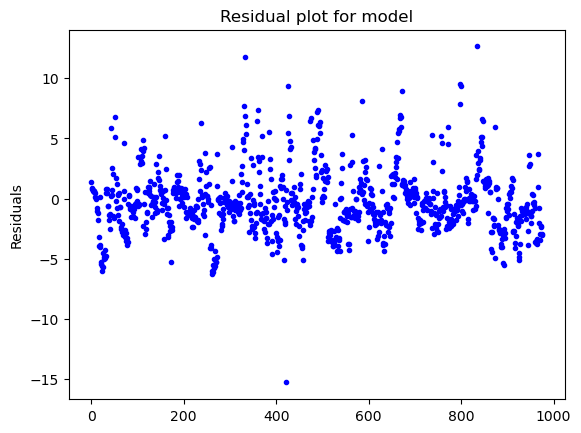

In [73]:
residual = y_test - y_pred_gbr
y_preds = pd.Series(y_pred_gbr)
y_preds.index = range(0,len(y_preds))
residual.index = range(0,len(residual))
a = pd.concat([residual,y_preds],axis=1,ignore_index=True)
resid_data = pd.DataFrame(a)
resid_data.columns = ['Residuals','Predicted']
plt.plot(resid_data['Residuals'], 'o', color='blue', markersize=3)
plt.title('Residual plot for model')
plt.ylabel('Residuals')
plt.show()

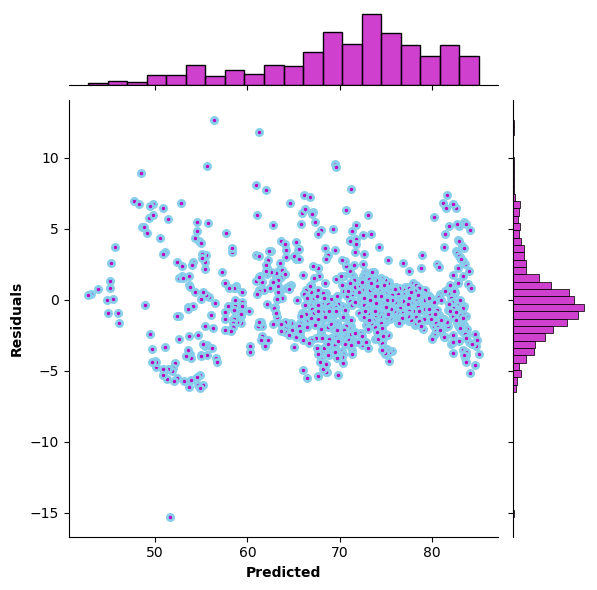

In [74]:
ax = sns.jointplot(x=resid_data['Predicted'], y=resid_data['Residuals'], kind='scatter', s=20, color='m', edgecolor="skyblue", linewidth=2)
ax.ax_joint.set_xlabel('Predicted', fontweight='bold')
ax.ax_joint.set_ylabel('Residuals', fontweight='bold')
plt.show()

This plot of residuals versus fits shows that the residual variance (vertical spread) increases as the fitted values (predicted values of sale price) increase. This violates the assumption of constant error variance.

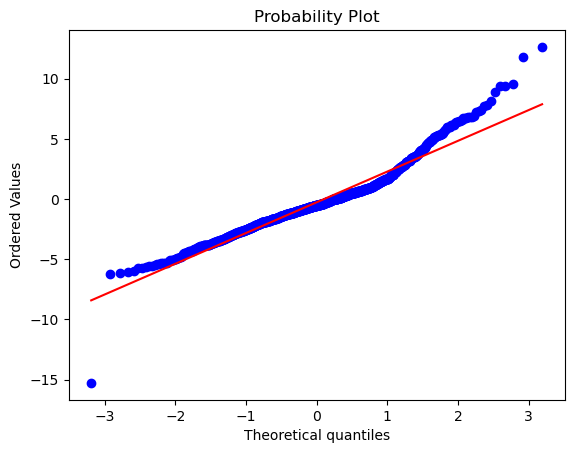

In [79]:
stats.probplot(resid_data['Residuals'], dist="norm", plot=pylab)
pylab.show()

### Shapley values

In [80]:
gbr_hyp.fit(X_train, y_train);

# explain the model's predictions using SHAP
explainer = shap.TreeExplainer(gbr_hyp)
shap_values = explainer.shap_values(X_train)

# visualize the first prediction's explanation 
shap.initjs()


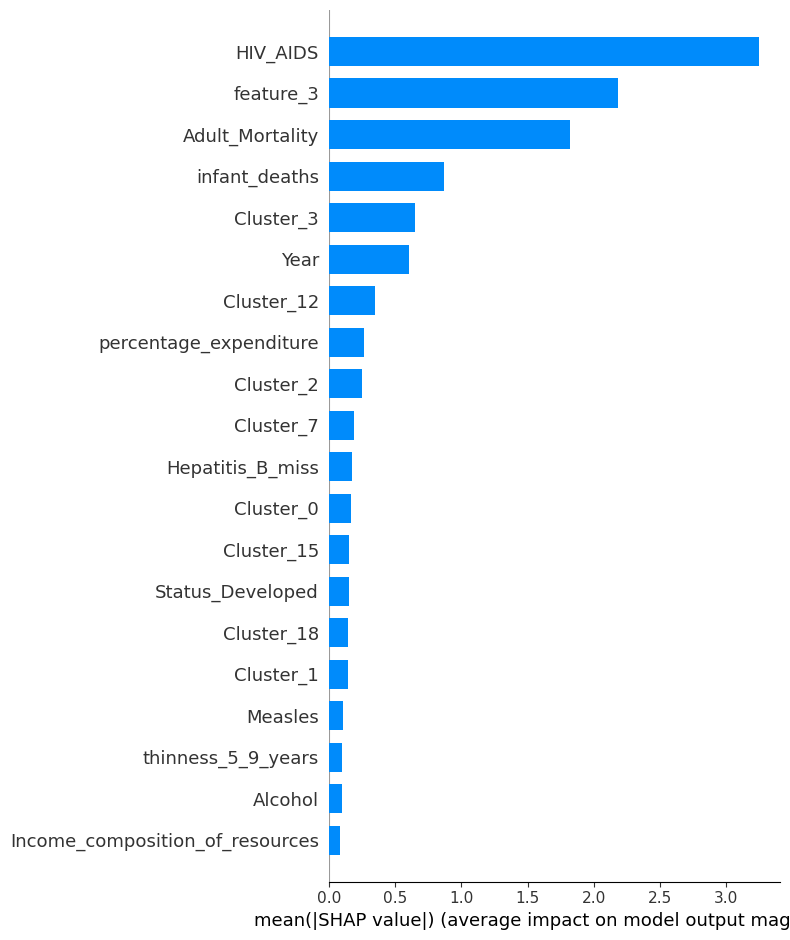

In [81]:
shap_values = shap.TreeExplainer(gbr_hyp).shap_values(X_train)
shap.summary_plot(shap_values, X_train, plot_type="bar")

/Users/keithlowton/anaconda3/envs/Regressions/lib/python3.10/site-packages/shap/plots/_beeswarm.py:664: UserWarning:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored



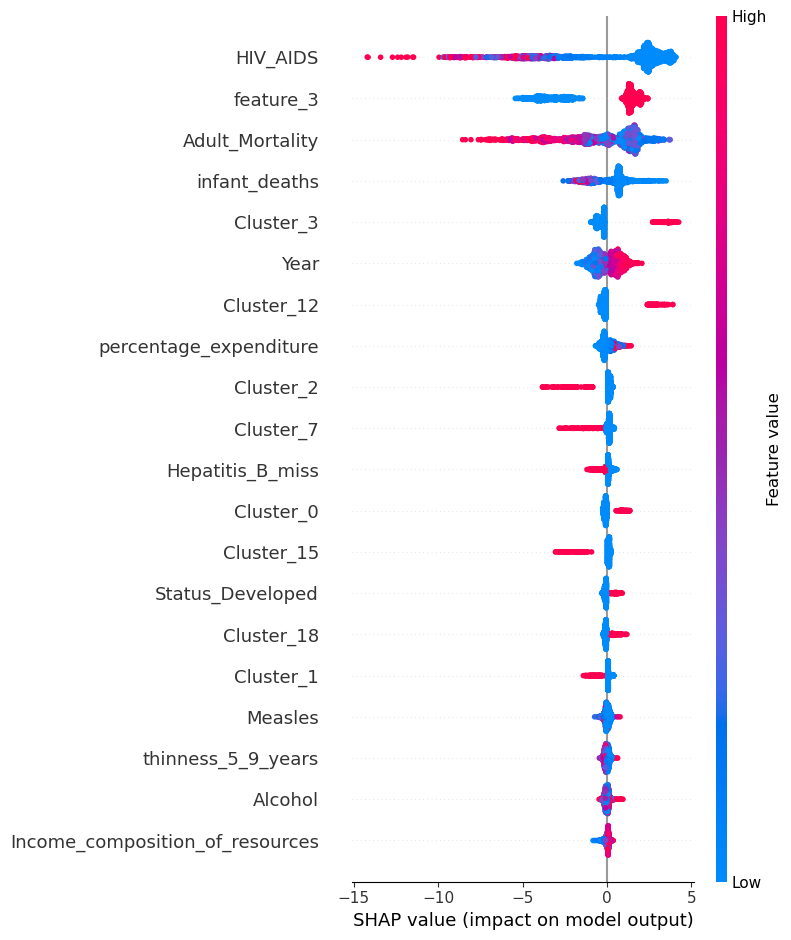

In [82]:
shap.summary_plot(shap_values, X_train)